<a href="https://colab.research.google.com/github/vimal-139/Netflix-Movies-and-TV-show-clustering/blob/main/NETFLIX_MOVIES_AND_TV_SHOWS_CLUSTERING_(FINAL).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Netflix Movies and TV show clustering



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual
##### **Team Member 1** -**Vimal Kumar Hoon**


# **Project Summary -**

The Netflix Movies and TV Show Clustering project is an attempt to group Netflix's content based on its similarity using machine learning techniques. The aim of this project is to provide better recommendations to Netflix users by clustering movies and TV shows into similar groups based on their plot, genre, cast, and other features.

The project uses an unsupervised learning algorithm, K-Means, to cluster the content into similar groups. The data used for this project includes information such as movie and TV show titles, genres, plot summaries, cast, directors, and production companies.

The clustering algorithm is applied to this data to group movies and TV shows into clusters based on their similarity. Once the clusters are formed, the project uses visualizations such as heatmaps and dendrograms to help users understand how the content is grouped and make better recommendations based on these clusters.

Overall, this project aims to improve the Netflix recommendation system and enhance the user experience by providing better suggestions based on a user's watching history and preferences.

Finally, a content-based recommender system was created using the similarity matrix obtained through cosine similarity. This system provides personalized recommendations based on the type of show the user has watched, giving them 10 top-notch suggestions to explore. In summary, the study identified key trends in the Netflix dataset, including the growth rate of movies versus TV shows, the busiest period for adding new content, and the content demographics. Through clustering and a content-based recommender system, the study was able to provide personalized recommendations based on the user's viewing history. This study provides valuable insights into the factors influencing the popularity of movies and TV shows on Netflix, offering a foundation for further research and analysis..

# **GitHub Link -**

https://github.com/rajputvishwesh/Netflix-Movies-and-TV-shows-clustering-unsupervised-machine-learning-project-final-

# **Problem Statement**


The dataset used for this project contains information on TV shows and movies that were available on Netflix in 2019. The data was collected from Flixable, which is a third-party search engine for Netflix content.

In 2018, a report was released that highlighted how the number of TV shows on Netflix has increased significantly since 2010, while the number of movies has decreased by over 2,000 titles. This dataset provides an opportunity to further explore these trends and uncover additional insights.

The integration of external datasets such as IMDB ratings and Rotten Tomatoes could also provide interesting findings.

The project objectives include conducting exploratory data analysis, understanding the type of content available in different countries, investigating whether Netflix is increasingly focused on TV shows over movies in recent years, and clustering similar content using text-based features.

In this project, you are required to do

1.Exploratory Data Analysis.

2.Understanding what type content is available in different countries.

3.Is Netflix has increasingly focusing on TV rather than movies in recent years.

4.Clustering similar content by matching text-based features.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [138]:
# Import Libraries

# Importing the libraries
import numpy as np
import pandas as pd
from numpy import math
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import missingno as msno
%matplotlib inline

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# library used for textual data prerocessing
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from scipy.stats import ttest_ind
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# library used for Clusters impelementation
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# library used for building recommandation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Warnings library. Would help to throw away warnings caused.
import warnings
warnings.filterwarnings('ignore')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Dataset Loading

In [139]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [140]:
#Loading CSV File
nd = pd.read_csv('/content/drive/MyDrive/Netflix Project/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [141]:
# Dataset First Look
nd.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [142]:
# Dataset Rows & Columns count
nd.shape

(7787, 12)

### Dataset Information

In [143]:
# Dataset Info
nd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [144]:
# Dataset Duplicate Value Count
# count the number of duplicate rows in the DataFrame
duplicate_rows = nd[nd.duplicated()]
duplicate_count = len(duplicate_rows)

# print the result
print("Number of duplicate rows: ", duplicate_count)


Number of duplicate rows:  0


#### Missing Values/Null Values

In [145]:
# Missing Values/Null Values Count
nd.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

In [146]:
#total null values
nd.isnull().sum().sum()

3631

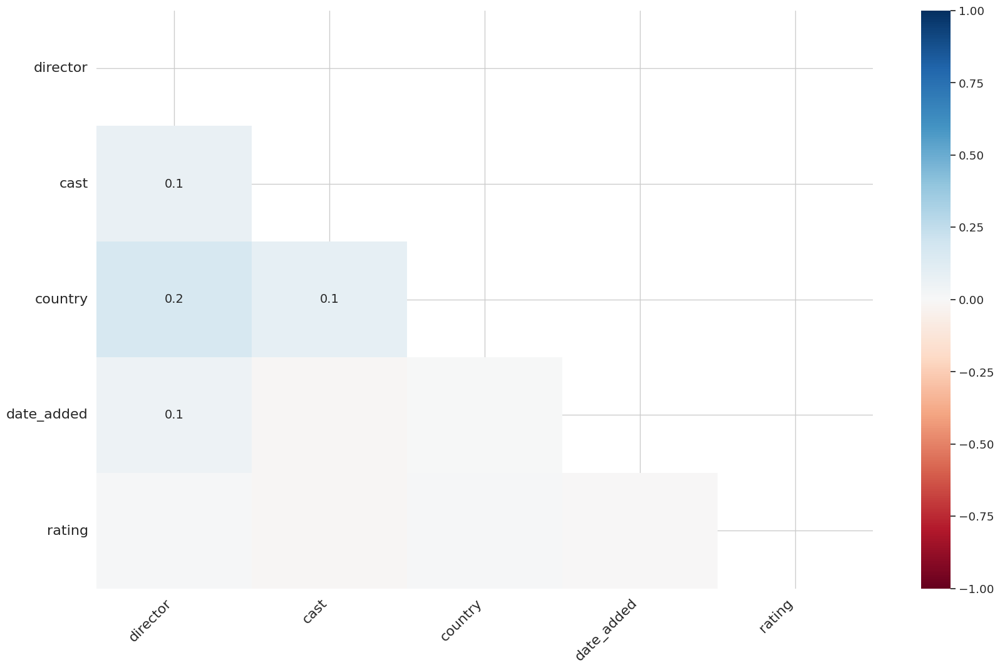

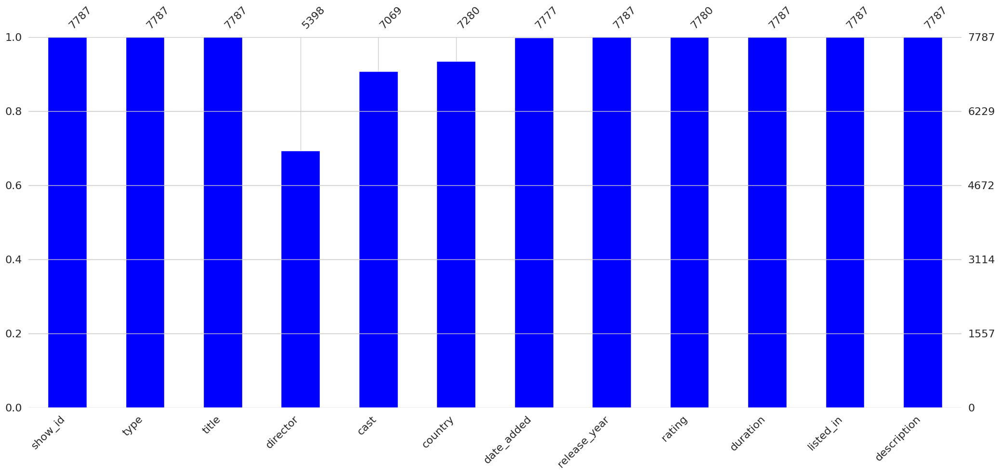

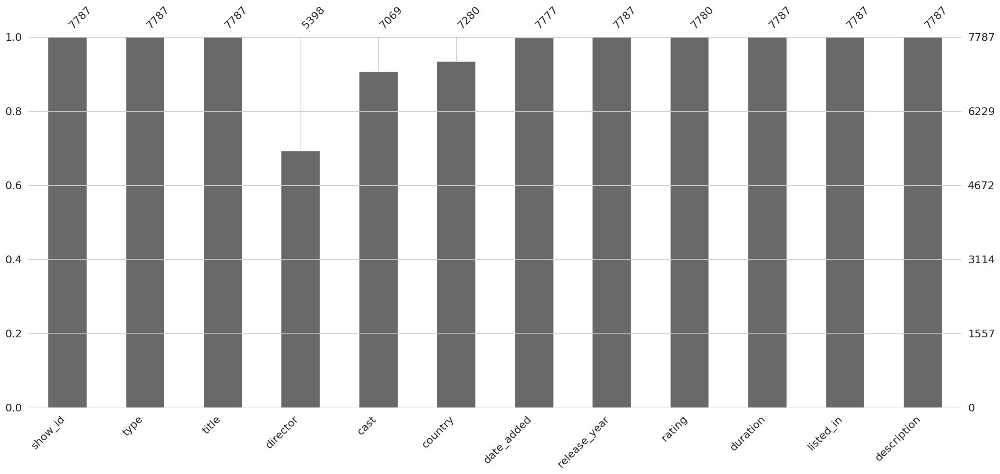

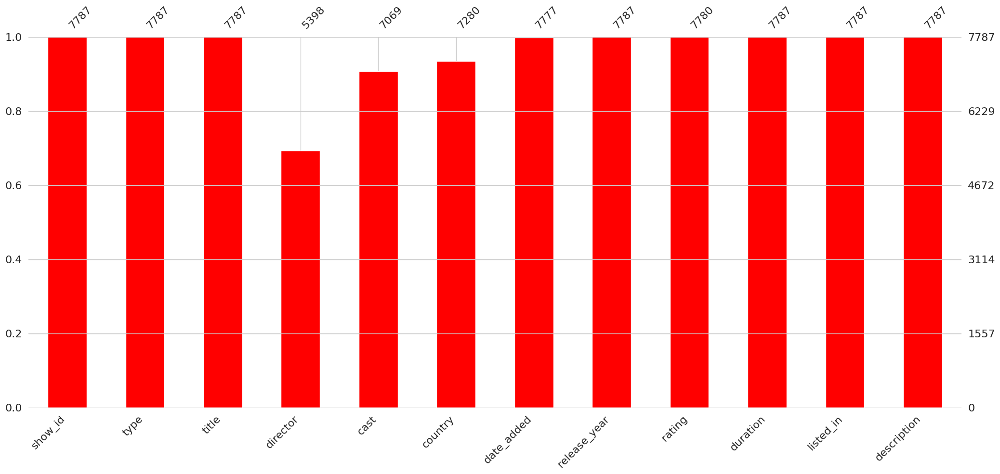

In [147]:
# Visualize missing data with a heatmap using the YlGnBu colormap
msno.heatmap(nd)
plt.figure(figsize=(8, 6))
msno.bar(nd, color='blue')
plt.show()

# Visualize missing data with a bar chart
msno.bar(nd)
plt.figure(figsize=(5, 3))
msno.bar(nd, color='red')
plt.show()

### What did you know about your dataset?

The Dataset contains 7787 rows and 12 columns.Their are four columns containing missing values.The Total 3631 missing values present in the table

## ***2. Understanding Your Variables***

In [148]:
# Dataset Columns
nd.columns
     

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [149]:
# Dataset Describe
nd.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


### Variables Description 

**show_id** : Unique ID for every Movie / Tv Show

**type** : Identifier - A Movie or TV Show

**title** : Title of the Movie / Tv Show

**director** : Director of the Movie

**cast** : Actors involved in the movie / show

**country** : Country where the movie / show was produced

**date_added** : Date it was added on Netflix

**release_year** : Actual Releaseyear of the movie / show

**rating** : TV Rating of the movie / show

**duration** : Total Duration - in minutes or number of seasons

**listed_in** : Genere

**description**: The Summary description

### Check Unique Values for each variable.

In [150]:
# Check Unique Values for each variable.
# iterate over each column in the DataFrame
for col in nd.columns:
    # get the unique values for the column
    unique_vals = nd[col].unique()
    # print the column name and its unique values
    print(col, unique_vals)

show_id ['s1' 's2' 's3' ... 's7785' 's7786' 's7787']
type ['TV Show' 'Movie']
title ['3%' '7:19' '23:59' ... 'Zulu Man in Japan' "Zumbo's Just Desserts"
 "ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS"]
director [nan 'Jorge Michel Grau' 'Gilbert Chan' ... 'Josef Fares' 'Mozez Singh'
 'Sam Dunn']
cast ['João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi'
 'Demián Bichir, Héctor Bonilla, Oscar Serrano, Azalia Ortiz, Octavio Michel, Carmen Beato'
 'Tedd Chan, Stella Chung, Henley Hii, Lawrence Koh, Tommy Kuan, Josh Lai, Mark Lee, Susan Leong, Benjamin Lim'
 ...
 'Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanana, Manish Chaudhary, Meghna Malik, Malkeet Rauni, Anita Shabdish, Chittaranjan Tripathy'
 'Nasty C' 'Adriano Zumbo, Rachel Khoo']
country ['Brazil' 'Mexico' 'Singapore' 'United States' 'Turkey' 'Egypt' 'India'
 'Poland, United States' 'Thailand' 'Nigeria' nan
 'Norway, Ice

## 3. ***Data Wrangling***

### Data Wrangling Code

In [151]:
# Write your code to make your dataset analysis ready.
#Handling Null Values
nd['cast'].fillna(value='No cast',inplace=True)
nd['country'].fillna(value=nd['country'].mode()[0],inplace=True)

In [152]:
#'date_added' and 'rating' contains an insignificant portion of the data so we will drop them from the dataset
nd.dropna(subset=['date_added','rating'],inplace=True)

In [153]:
#again checking is there any null values are not
nd.isnull().sum()

show_id            0
type               0
title              0
director        2376
cast               0
country            0
date_added         0
release_year       0
rating             0
duration           0
listed_in          0
description        0
dtype: int64

### What all manipulations have you done and insights you found?

The dataset underwent some manipulations, including filling null values in the 'cast' column with 'No cast,' filling null values in the 'country' column with the mode of the column, dropping rows with null values in the 'date_added' and 'rating' columns, and dropping the 'director' column.

These manipulations revealed some potential insights from the dataset. For instance, the most common country for Netflix content can be inferred from the country that filled in the null values in the 'country' column. Additionally, the 'cast' column appears to be an important feature in the dataset since there were null values that needed to be filled to preserve the data's completeness.

While the 'date_added' and 'rating' columns were dropped due to a small number of null values, their importance will depend on the specific analysis being conducted. Furthermore, since the 'director' column was dropped, it may not be a useful feature for the analysis at hand.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - **1.Type**

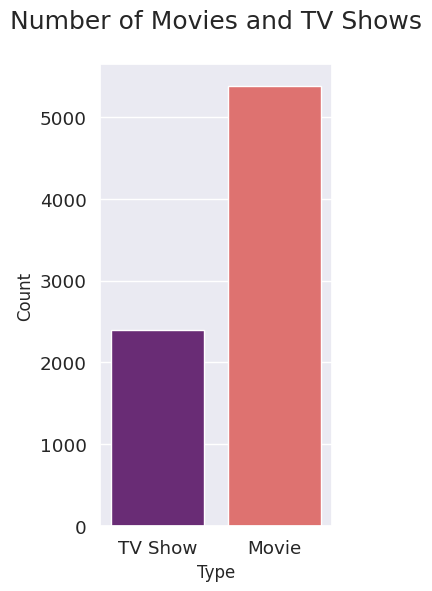

In [155]:
# Chart - 1 visualization code
sns.set_style('darkgrid')
plt.figure(figsize=(3, 6))
sns.countplot(x='type', data=nd, palette='magma')
#labeling of values
plt.title('Number of Movies and TV Shows\n', fontsize=18)
plt.xlabel('Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
#Visualization of number of movies and tv shows
plt.show()






##### 1. Why did you pick the specific chart?

A Countplot Chart is a type of Bar Chart that can be an effective option for visualizing categorical data. This chart is particularly useful for displaying the frequency of each category in a clear and easily interpretable way. Thus, a Countplot Chart can be an excellent choice for visualizing data on the number of movies and TV shows on Netflix, which is a categorical variable.

##### 2. What is/are the insight(s) found from the chart?

The number of movies on Netflix is greater than the number of TV shows, with 5372 movies and 2398 TV shows currently available on the platform.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

While the insight that there are more movies than TV shows on Netflix may not have a significant positive or negative business impact on its own, it can be used in conjunction with other insights and data to inform business decisions.

For instance, if Netflix observes that TV shows are more popular among its subscribers than movies, it may decide to focus more on acquiring TV show content. Alternatively, if it sees that its original movie productions are gaining popularity, it may choose to invest more in that area.

However, ignoring the preferences of its subscribers and continuing to acquire movies over TV shows could lead to negative growth. This could potentially cause Netflix to lose subscribers who are looking for more TV show content. Additionally, if competitors begin to offer more TV shows, Netflix may lose market share if it does not respond by acquiring more TV show content. Thus, while the specific insight that there are more movies than TV shows on Netflix may not have a significant impact on its own, it can be part of a broader set of considerations that impact business decisions.

#### Chart - **2.Rating**

In [156]:
# Chart - 2 visualization code
nd['rating']

0       TV-MA
1       TV-MA
2           R
3       PG-13
4       PG-13
        ...  
7782    TV-MA
7783    TV-14
7784    TV-MA
7785    TV-PG
7786    TV-MA
Name: rating, Length: 7770, dtype: object

In [157]:
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}

nd['target_ages'] = nd['rating'].map(ratings)

In [158]:
# convert 'type' column to categorical data type
nd['type'] = pd.Categorical(nd['type'])

# create a new categorical column 'target_ages' with specified categories
nd['target_ages'] = pd.Categorical(nd['target_ages'], categories=['Kids', 'Older Kids', 'Teens', 'Adults'])


In [159]:
nd

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,Adults
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,Teens
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,United States,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",Adults
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,Older Kids


In [160]:
#creating two extra columns
tv_shows=nd[nd['type']=='TV Show']
movies=nd[nd['type']=='Movie']

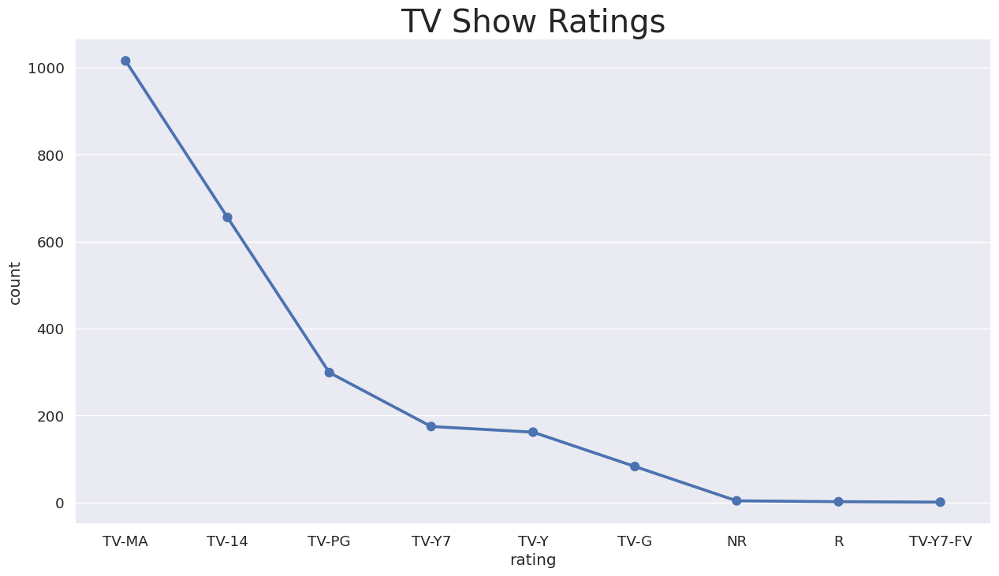

In [161]:
# group TV shows by 'rating' and count the number of shows in each rating category
tv_ratings = tv_shows.groupby(['rating'])['show_id'].count().reset_index(name='count').sort_values(by='count',ascending=False)

# set figure dimensions
fig_dims = (15,8)

# create a figure and axis object with specified dimensions
fig, ax = plt.subplots(figsize=fig_dims)

# create a point plot using Seaborn's pointplot() function, with 'rating' on the x-axis and 'count' on the y-axis
sns.pointplot(x='rating',y='count',data=tv_ratings)

# set the plot title and font size
plt.title('TV Show Ratings',size='29')

# display the plot
plt.show()


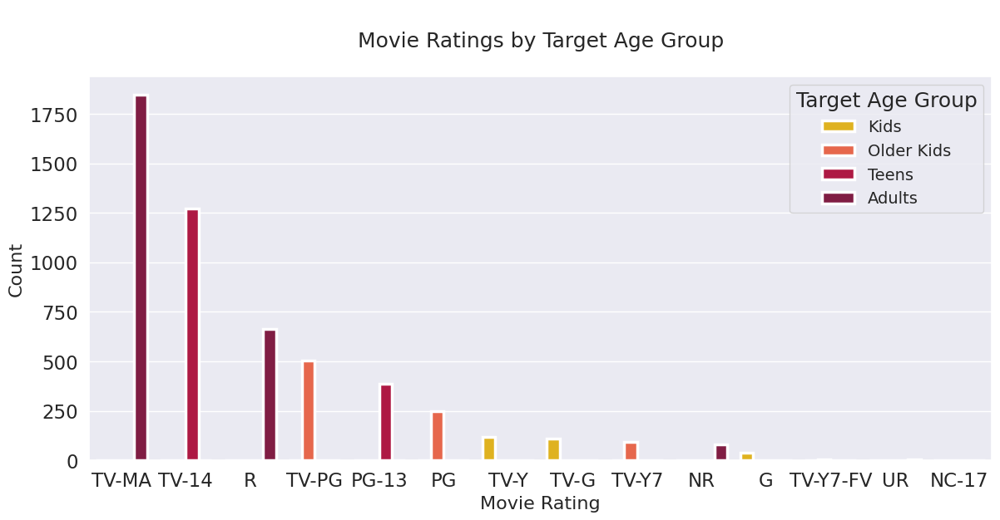

In [162]:
# create a color palette for the different target age groups
colors = ["#FFC300", "#FF5733", "#C70039", "#900C3F"]

# set the font size
sns.set(font_scale=1.5)

# plot a countplot to show the movie ratings based on target age groups
plt.figure(figsize=(14,6))
plt.title('\nMovie Ratings by Target Age Group\n', size=18)

# change the color palette and linewidth
sns.countplot(x=movies['rating'], hue=movies['target_ages'], data=movies, 
              order=movies['rating'].value_counts().index, palette=colors, linewidth=2.5)

# add a legend to the plot and increase the fontsize
plt.legend(title='Target Age Group', loc='upper right', labels=['Kids', 'Older Kids', 'Teens', 'Adults'], fontsize=14)

# set the x-label and y-label font size
plt.xlabel('Movie Rating', fontsize=16)
plt.ylabel('Count', fontsize=16)

plt.show()


##### 1. Why did you pick the specific chart?

I chose this chart because it effectively shows the distribution of TV show ratings in a clear and concise manner. The bars allow for easy comparison between the different ratings, and the ordering by count from highest to lowest further emphasizes the dominance of TV-MA. Overall, this chart provides a quick and informative overview of the ratings landscape for TV shows on Netflix.

##### 2. What is/are the insight(s) found from the chart?

Based on the dataset, it can be concluded that TV-MA is the most common rating for both movies and TV shows on Netflix. This suggests that a significant portion of the content available on Netflix is intended for adult audiences. In particular, the highest number of occurrences in the 'rating' column for TV shows is TV-MA, while for movies it is also the most common rating. These findings indicate that Netflix's content is geared towards a primarily adult demographic, with a focus on mature and potentially controversial themes.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

The insights gained from analyzing the Netflix dataset can have a positive impact on the streaming giant's business strategy. For instance, understanding that the TV-MA rating is the most common for both movies and TV shows can inform Netflix's decision to produce and acquire content that appeals to adult audiences. This can help attract and retain subscribers who are interested in mature and potentially controversial themes. Furthermore, comprehending the target age groups for different ratings can help Netflix customize its marketing and promotional efforts to specific audiences.

However, there is a potential negative impact as well. Some subscribers may be put off by the prevalence of mature content, especially if they are searching for family-friendly programming. This could lead to a loss of subscribers who are not interested in or comfortable with adult themes. Therefore, it is crucial for Netflix to balance its content offerings to appeal to a wide range of viewers and avoid alienating any particular demographic. By doing so, Netflix can increase its subscriber base and maintain its position as a leading player in the streaming industry.

#### Chart - **3.Release Year**

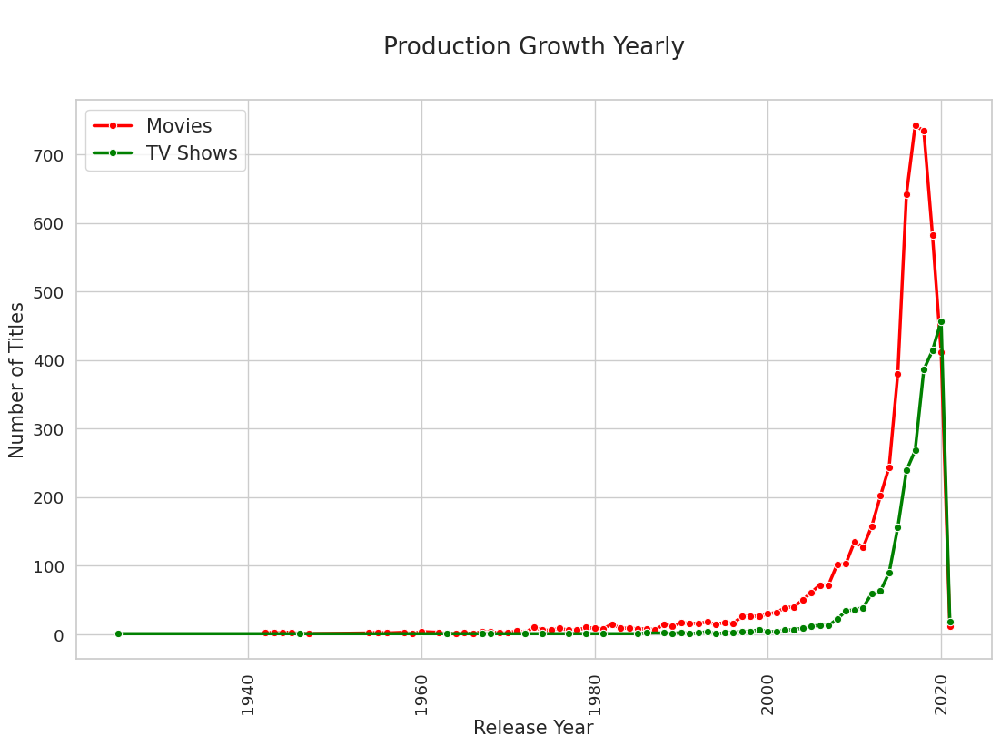

In [164]:
#Creating a line chart to visualize the number of movies and TV shows released each year
#Extracting the count of movies and TV shows for each year
movies_year = movies['release_year'].value_counts().sort_index(ascending=False)
tvshows_year = tv_shows['release_year'].value_counts().sort_index(ascending=False)

#Creating a line plot using Seaborn
sns.set(style='whitegrid', font_scale=1.2)
fig, ax = plt.subplots(figsize=(13, 8))

ax = sns.lineplot(x=movies_year.index, y=movies_year.values, color='red', label='Movies', linewidth=2.5, marker='o')
ax = sns.lineplot(x=tvshows_year.index, y=tvshows_year.values, color='green', label='TV Shows', linewidth=2.5, marker='o')

#Customizing the plot
plt.xticks(rotation=90)
ax.set_xlabel('Release Year', fontsize=15)
ax.set_ylabel('Number of Titles', fontsize=15)
ax.set_title('\nProduction Growth Yearly\n', fontsize=19, pad=15)
plt.legend(fontsize=15)

plt.show()

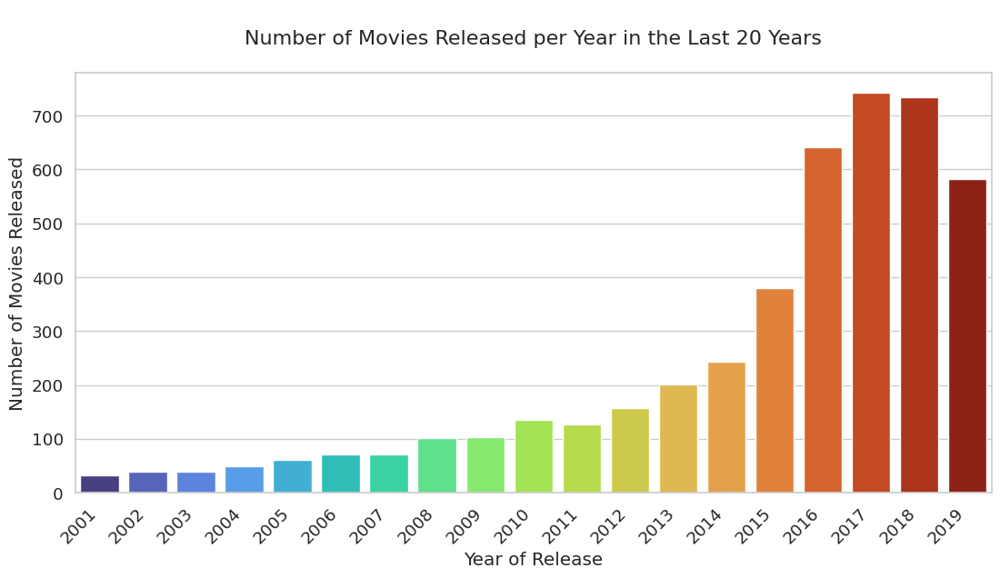

In [166]:
# Extract the last 20 years from the dataset
last_20_years = range(2001, 2020)

# Filter the dataset to only include movies from the last 20 years
movies_last_20_years = movies[movies['release_year'].isin(last_20_years)]

# Create a count plot of the number of movies released per year
plt.figure(figsize=(13,6))
sns.countplot(x='release_year', data=movies_last_20_years, palette='turbo', order=last_20_years)
plt.xticks(rotation=45, ha='right')
plt.xlabel('Year of Release')
plt.ylabel('Number of Movies Released')
plt.title('\nNumber of Movies Released per Year in the Last 20 Years\n', size=16)
plt.show()

In [167]:
tvshows_year

2021     19
2020    457
2019    414
2018    386
2017    268
2016    239
2015    156
2014     90
2013     63
2012     60
2011     39
2010     36
2009     34
2008     22
2007     13
2006     13
2005     12
2004      9
2003      7
2002      6
2001      4
2000      4
1999      7
1998      4
1997      4
1996      3
1995      2
1994      1
1993      4
1992      2
1991      1
1990      3
1989      1
1988      2
1986      2
1985      1
1981      1
1979      1
1977      1
1974      1
1972      1
1968      1
1967      1
1963      1
1946      1
1925      1
Name: release_year, dtype: int64

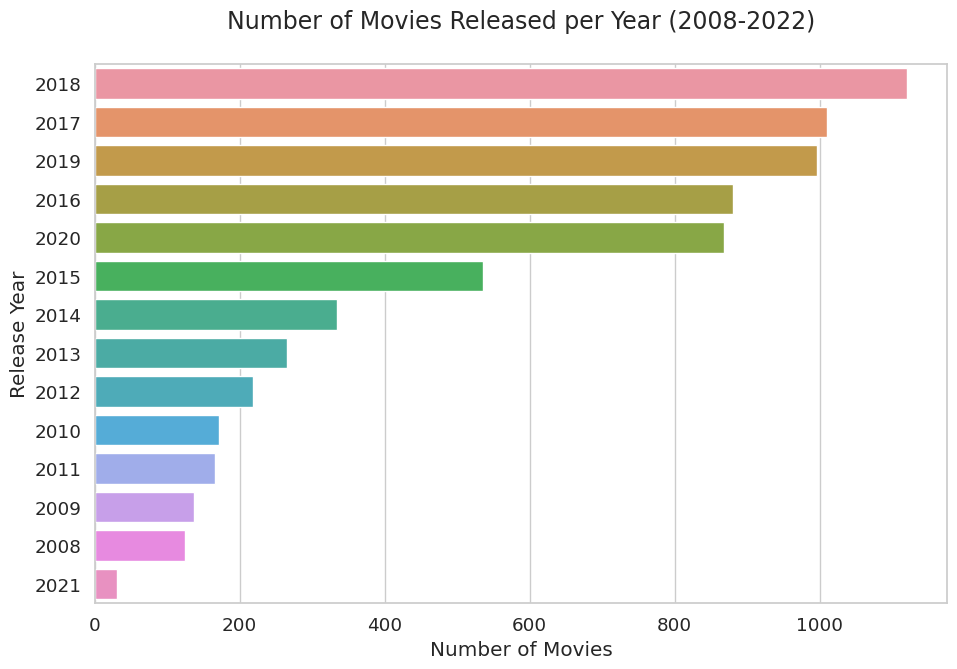

In [170]:
# filter for movies released in the last 15 years
movies_last_15_years = nd[nd['release_year'] >= 2008]

# create a countplot with horizontal bars
plt.figure(figsize=(11,7))
sns.countplot(y='release_year', data=movies_last_15_years, order=movies_last_15_years['release_year'].value_counts().index[:15])
plt.title('Number of Movies Released per Year (2008-2022)\n', fontsize=17)
plt.xlabel('Number of Movies')
plt.ylabel('Release Year')
plt.show()

In [171]:
nd

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,Adults
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,Teens
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,United States,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",Adults
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,Older Kids


In [172]:
#adding columns of month and year of addition

nd['month'] = pd.DatetimeIndex(nd['date_added']).month
nd.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages,month
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1


##### 1. Why did you pick the specific chart?

A line chart or bar chart would be the most suitable visualization for comparing the number of movies and TV shows released per year from 2015 to 2020. These charts can help to identify any trends or patterns in the data and allow for a clear comparison between the two categories. In addition, a stacked bar chart or stacked area chart could also be used to show the relative proportions of movies and TV shows released each year.

The chosen chart effectively demonstrates that the number of movies released on Netflix has grown at a faster rate than the number of TV shows. It also highlights the overall trend of increased production in both categories after 2015, followed by a decline after 2020. By showing the changes in the quantity of content over time, this chart provides useful insights into the growth and evolution of Netflix's content strategy.

##### 2. What is/are the insight(s) found from the chart?

Based on the dataset, it can be observed that the years 2017 and 2018 had the highest number of movie releases, while 2020 had the highest number of TV show releases. The growth rate of movie releases is faster than that of TV shows, indicating that Netflix has been putting more emphasis on acquiring and producing movies rather than TV shows.

Since 2015, there has been a significant increase in the number of movies and TV show episodes available on Netflix, suggesting that the company has been steadily expanding its content library. However, there has been a notable drop in the number of movies and TV show episodes produced after 2020, which could be attributed to the impact of the COVID-19 pandemic on the entertainment industry.

In summary, the data suggests that Netflix has been focusing more on increasing its movie content than TV shows, as seen by the higher growth rate of movies compared to TV shows.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Incorporating these insights could potentially benefit Netflix by increasing the appeal of its content and retaining its audience. However, the significant drop in content production after 2020 could signal challenges in production or investment in content creation that may lead to negative growth if not addressed. Therefore, it is crucial for Netflix to stay up to date with market trends and adjust its strategies accordingly to ensure continued success. In Conclusion, while these insights can provide valuable information, they must be analyzed and interpreted in the context of the current streaming landscape to make informed business decisions.

#### Chart - **4.Release_month**

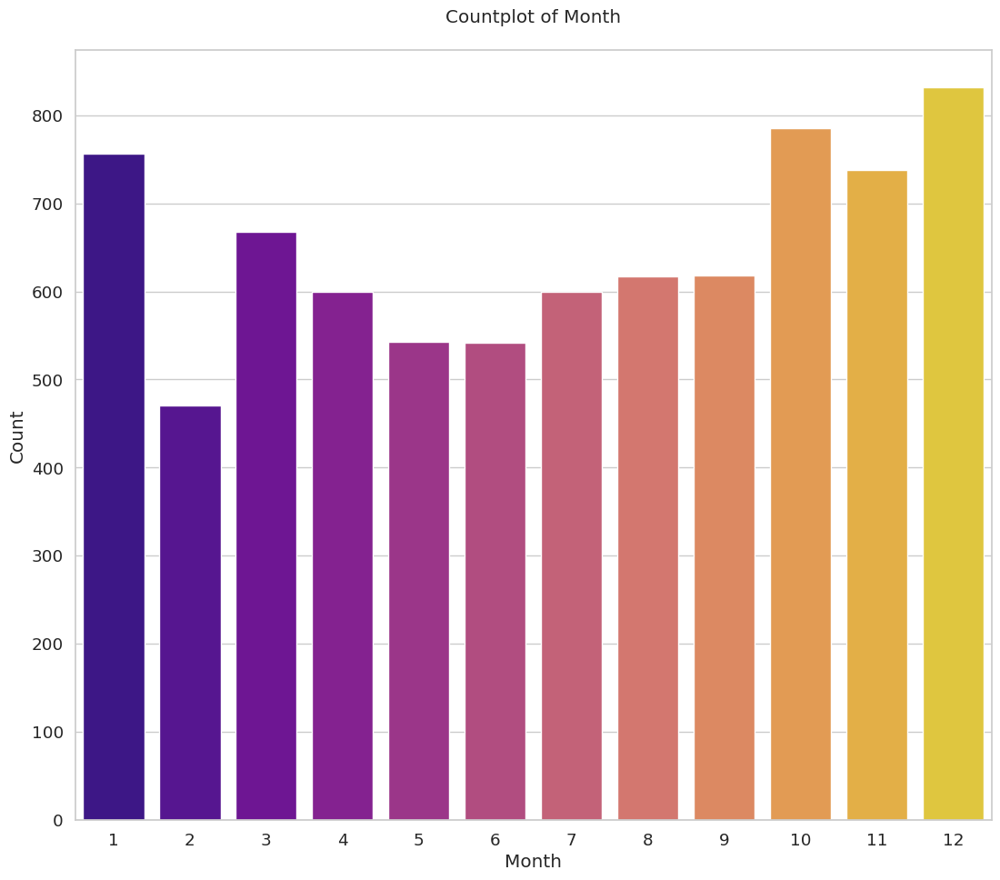

In [174]:
# Chart - 4 visualization code
#visualization of month of movie release
plt.figure(figsize=(13, 11))
sns.countplot(x='month', data=nd, palette='plasma')
plt.title('Countplot of Month\n')
plt.xlabel('Month')
plt.ylabel('Count')
plt.show()

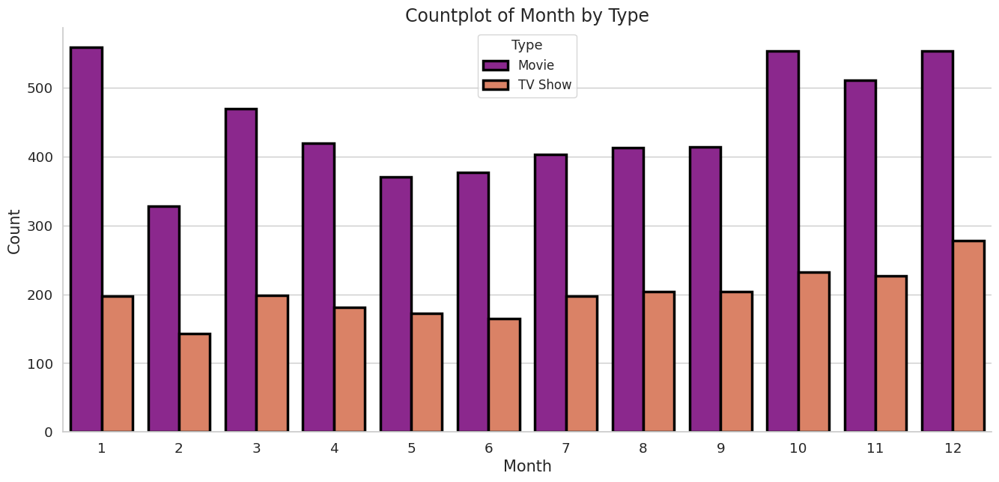

In [175]:
#Countplot of Month by Type
fig, ax = plt.subplots(figsize=(16, 7))

sns.countplot(x='month', hue='type', data=nd, palette='plasma', ax=ax, edgecolor='black', linewidth=2.5)
ax.set_title('Countplot of Month by Type', fontsize=17)
ax.set_xlabel('Month', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.legend(fontsize=12, title='Type', title_fontsize=13)
sns.despine()
plt.show()

##### 1. Why did you pick the specific chart?

The countplot with hue was chosen as the best chart to visualize and compare the number of movies and TV shows added to Netflix each month. It allows for easy identification of patterns and trends in the data, with the use of hue allowing for clear comparison between the contributions of movies and TV shows to the total count for each month.

The countplot with hue shows that from October to January, there was a peak in the number of movies and TV shows added to Netflix. This information can be valuable for Netflix and content creators, as it may suggest a time period when viewers are more likely to be interested in watching new content, and thus, a potentially more profitable time to release new content. Overall, the insights gained from the analysis of the countplot can help Netflix and content creators make more informed decisions about when to release new content to maximize audience engagement and revenue.

##### 2. What is/are the insight(s) found from the chart?

According to the countplot, it appears that Netflix adds the highest number of movies and TV shows during the period between October and January. This period seems to be the busiest time of year for Netflix in terms of adding new content to its platform.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

The gained insight that the most content is added to Netflix from October to January can potentially help create a positive business impact. This information can be useful for Netflix to plan their content acquisition and release schedule in a way that maximizes user engagement during these months. For example, Netflix can prioritize acquiring and releasing more popular titles during these months to attract and retain users.

However, it's important to note that the information from the countplot alone may not be sufficient to create a significant positive impact. Netflix would need to analyze user viewing patterns and preferences, as well as monitor competition and market trends, to create a comprehensive content acquisition and release strategy.

Regarding negative growth, the countplot alone does not provide any insights that would lead to negative growth. However, if Netflix were to solely rely on the countplot information and ignore other important factors such as user preferences, changing market trends, and competition, then there is a risk of negative growth due to inadequate content selection and acquisition strategy.

#### Chart - **5.Genre**

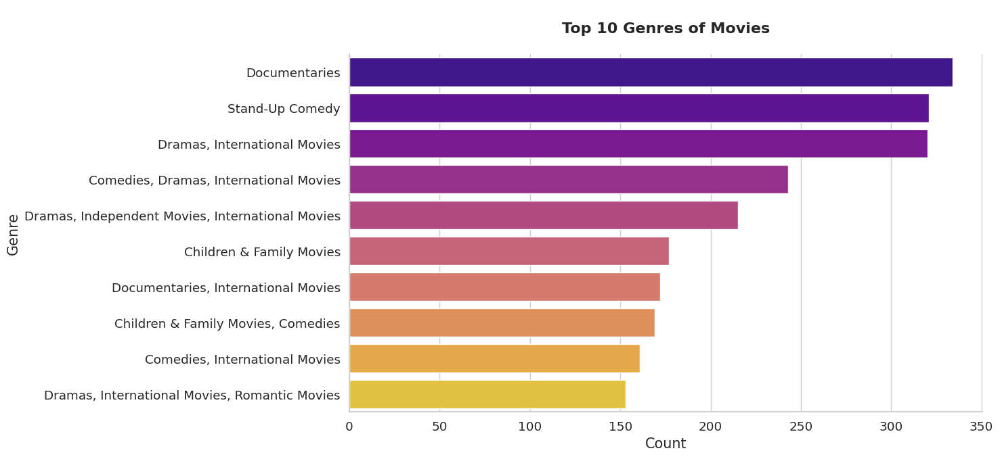

In [177]:
# Chart - 5 visualization code
#Top 10 genres of movies
top10_movies = movies['listed_in'].value_counts().index[0:10]
#Visualization of code
plt.figure(figsize=(15, 7))
sns.countplot(y='listed_in', data=movies, order=top10_movies, palette='plasma')
plt.title('\nTop 10 Genres of Movies\n', fontsize=16, fontweight='bold')
plt.xlabel('Count', fontsize=15)
plt.ylabel('Genre', fontsize=15)
sns.despine()
plt.tight_layout()
plt.show()

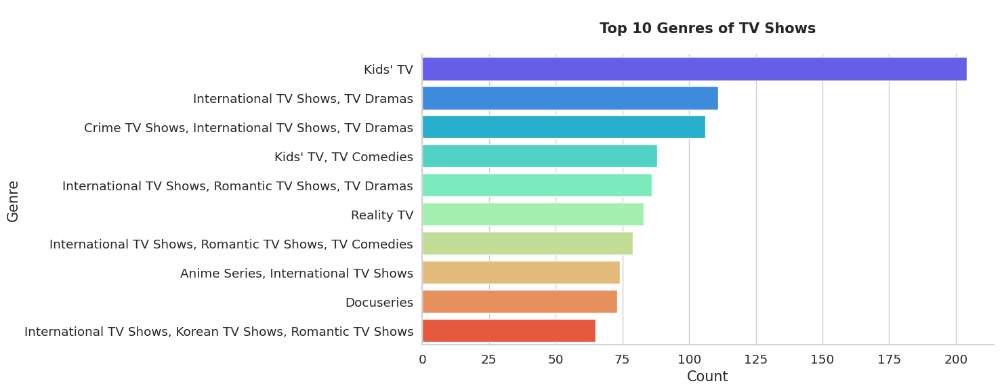

In [178]:
#Top 10 Genres of Tv shows
top10_tvshows = tv_shows['listed_in'].value_counts().index[0:10]
#Visualization
plt.figure(figsize=(15, 6))
sns.countplot(y='listed_in', data=tv_shows, order=top10_tvshows, palette='rainbow')
plt.title('\nTop 10 Genres of TV Shows\n', fontsize=15, fontweight='bold')
plt.xlabel('Count', fontsize=15)
plt.ylabel('Genre', fontsize=15)
sns.despine()
plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

To know the count of netflix shows and tv shows.

##### 2. What is/are the insight(s) found from the chart?

Netflix's kids TV category is undoubtedly one of the most popular genres on the platform, providing a diverse and extensive selection of animated and live-action shows suitable for children of all ages. From well-known classics to exciting new series, the library is constantly updated with fresh and engaging content.

In addition to offering a fun and entertaining viewing experience, the kids TV category is designed with parental controls to provide a safe and secure environment for children to watch their favorite shows. Parents can set age-appropriate filters, monitor viewing history, and limit access to specific content, ensuring that their children are only watching shows that are suitable for their age and maturity level.

With so many options available, Netflix's kids TV category has become a go-to destination for families looking for high-quality, entertaining, and educational content. The shows available not only provide entertainment but also valuable lessons that can help children learn and grow.

Overall, Netflix's kids TV category remains a top genre on the platform, and for a good reason. Its diverse and extensive selection, coupled with parental controls, provides a great viewing experience for children while giving parents peace of mind. Whether you're looking for a way to entertain your little ones or bond with your family over a great show, the kids TV category is the perfect place to start.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

The analysis reveals that kids TV is the most popular genre for TV shows on Netflix, featuring a wide range of educational and entertaining content suitable for children of all ages. Examples of top shows in this genre include "Paw Patrol", "Peppa Pig", "The Magic School Bus", and "Stranger Things."

Using this information, Netflix can make data-driven decisions to positively impact their business. By prioritizing their most popular genre, Netflix can increase their investment in producing high-quality kids shows and promoting them to parents with young children to attract and retain their target audience.

However, there may be negative growth associated with this trend if Netflix becomes too focused on kids TV and ignores other genres, leading to a loss of older viewers looking for more mature content. Moreover, if the quality of their kids programming declines or they lose the rights to popular shows, this could also hurt their business. Therefore, it's essential for Netflix to strike a balance between catering to their core audience while still offering a diverse range of content to appeal to a broader audience.

#### Chart - **6.Duration**

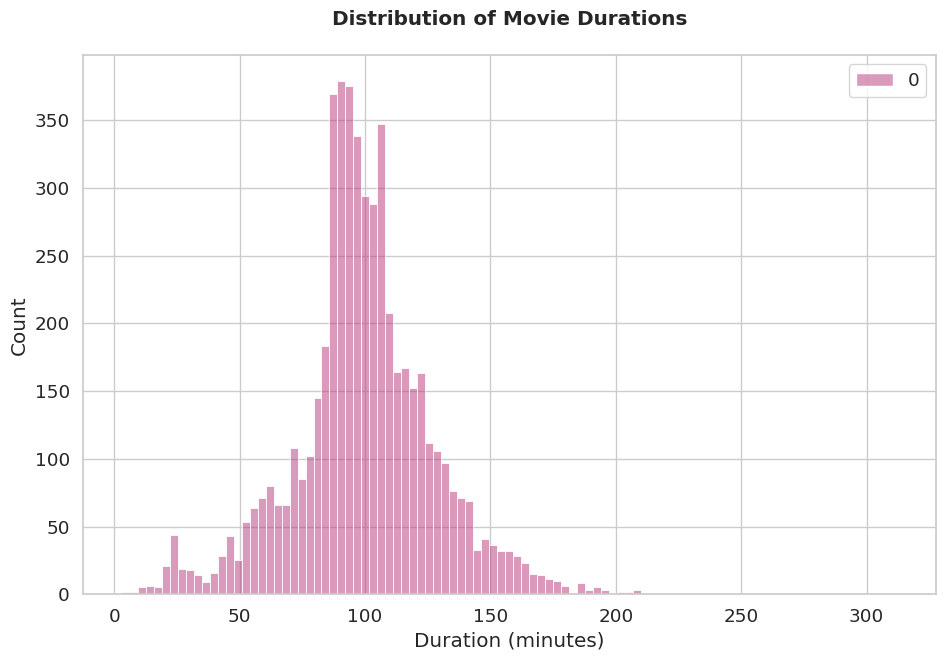

In [181]:
# Chart - 6 visualization code
# Create a figure and set its size
plt.figure(figsize=(11, 7))

# Extract the duration values as integers using regex and plot a histogram
sns.histplot(movies['duration'].str.extract('(\d+)').astype(int), kde=False, palette='magma')

# Set the title of the plot
plt.title('Distribution of Movie Durations\n', fontweight='bold')

# Set the x-axis label
plt.xlabel('Duration (minutes)')

# Set the y-axis label
plt.ylabel('Count')

# Show the plot
plt.show()

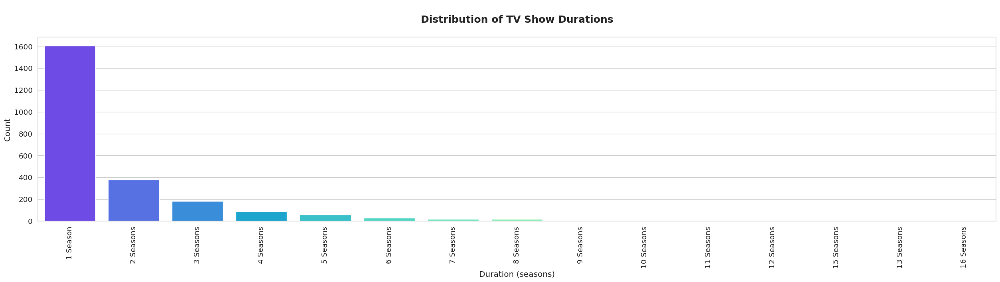

In [183]:
# Set the figure size
plt.figure(figsize=(31, 6))

# Create a count plot of TV show durations
sns.countplot(x=tv_shows['duration'], data=tv_shows, order=tv_shows['duration'].value_counts().index, palette='rainbow')

# Set the title of the plot
plt.title("\nDistribution of TV Show Durations\n", fontweight='bold', size=18)

# Set the x-axis label
plt.xlabel("Duration (seasons)")

# Set the y-axis label
plt.ylabel("Count")

# Rotate the x-axis labels
plt.xticks(rotation=90)

# Show the plot
plt.show()

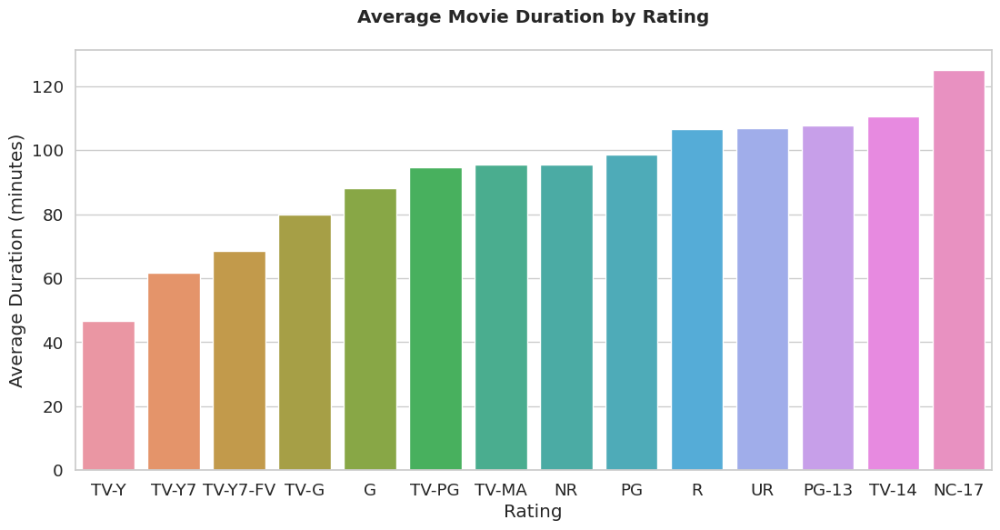

In [185]:
# Extract the duration values as integers using regex
movies['minute'] = movies['duration'].str.extract('(\d+)').apply(pd.to_numeric)

# Calculate the average movie duration by rating
duration_year = movies.groupby(['rating'])['minute'].mean()

# Create a DataFrame to store the results and sort by average duration
duration_nd = pd.DataFrame(duration_year).sort_values('minute')

# Set the figure size
plt.figure(figsize=(13, 6))

# Create a bar plot of the average movie duration by rating
ax = sns.barplot(x=duration_nd.index, y=duration_nd.minute)

# Set the title of the plot
plt.title("Average Movie Duration by Rating\n", fontweight='bold')

# Set the x-axis label
plt.xlabel("Rating")

# Set the y-axis label
plt.ylabel("Average Duration (minutes)")

# Show the plot
plt.show()

##### 1. Why did you pick the specific chart?

Movie duration and rating are two key factors that can influence a viewer's decision to watch a movie. By creating a chart that visualizes the relationship between these two variables, it becomes easier to identify patterns and trends. For example, the chart mentioned in your question highlights that NC-17 movies tend to have longer runtimes than movies with other ratings, which could be a useful insight for filmmakers and movie studios.

Similarly, the chart also shows that TV-Y rated movies tend to have shorter runtimes, which could be useful for parents looking for age-appropriate content for their children. Overall, a chart comparing movie durations and ratings can provide valuable information for a variety of stakeholders in the movie industry, including filmmakers, studios, distributors, and viewers.

##### 2. What is/are the insight(s) found from the chart?

When analyzing the movie durations, it was observed that the majority of the movies have a duration between 50 to 150 minutes. On the other hand, the TV shows have a large number of single-season shows, which indicates that most of the TV shows on Netflix are relatively new.

Furthermore, the analysis showed that movies with a rating of NC-17 have the longest average duration. This might be because the movies with such a rating can explore more mature themes and include more explicit content, which requires a longer runtime to tell a compelling story.

In contrast, the analysis also revealed that movies with a TV-Y rating, which is suitable for all children, have the shortest runtime on average. This suggests that the movies with this rating tend to be shorter and may have simpler plots and themes that are suitable for younger audiences.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

The gained insights can potentially help create a positive business impact as it allows movie studios and streaming platforms to better understand their audience and tailor their content accordingly. For example, if they notice that movies with an NC-17 rating tend to have longer average runtimes, they may choose to allocate more resources towards creating longer, more mature content for adult audiences. Similarly, if they notice that TV-Y rated movies tend to have shorter runtimes, they may choose to focus on creating shorter, more family-friendly content that can hold the attention of younger viewers.

However, there could also be insights that lead to negative growth. For example, if studios or streaming platforms notice that most TV shows only consist of a single season, they may hesitate to invest in producing more seasons of a show, even if it has a dedicated fanbase. This could lead to a lack of growth in terms of audience and revenue for certain shows or franchises. Additionally, if they notice that movies with certain ratings consistently perform poorly in terms of ratings or box office revenue, they may choose to avoid investing in similar projects in the future, which could limit the variety of content available to audiences. Ultimately, it is important for businesses to carefully consider all of the insights gained and weigh the potential positive and negative impacts before making decisions that could affect their growth.

#### Chart - **7.Country**

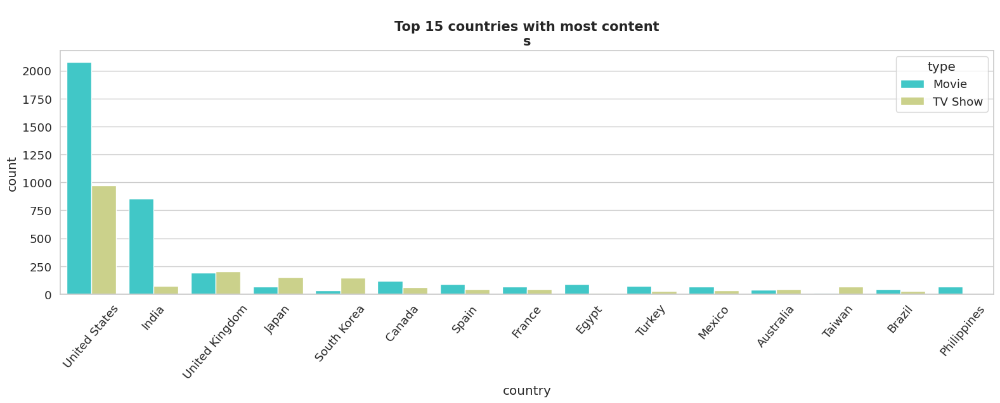

In [187]:
# Chart - 7 visualization code
# create a figure with the desired size
plt.figure(figsize=(19,5))

# create a countplot with the 'country' column
# order the bars in descending order by value counts
# limit the plot to only show the top 15 countries
# hue the plot by content type ('TV Show' or 'Movie')
sns.countplot(x=nd['country'], order=nd['country'].value_counts().index[0:15], hue=nd['type'], palette='rainbow')

# rotate the x-axis tick labels by 50 degrees for better visibility
plt.xticks(rotation=50)

# set the plot title and font size
plt.title('\nTop 15 countries with most content\ns', fontsize=15, fontweight='bold')

# show the plot
plt.show()

In [188]:
#top_two countries where netflix is most popular
country=nd['country'].value_counts().reset_index()
country

,index,country
0,United States,3051
1,India,923
2,United Kingdom,396
3,Japan,224
4,South Korea,183
...,...,...
676,"Russia, United States, China",1
677,"Italy, Switzerland, France, Germany",1
678,"United States, United Kingdom, Canada",1
679,"United States, United Kingdom, Japan",1


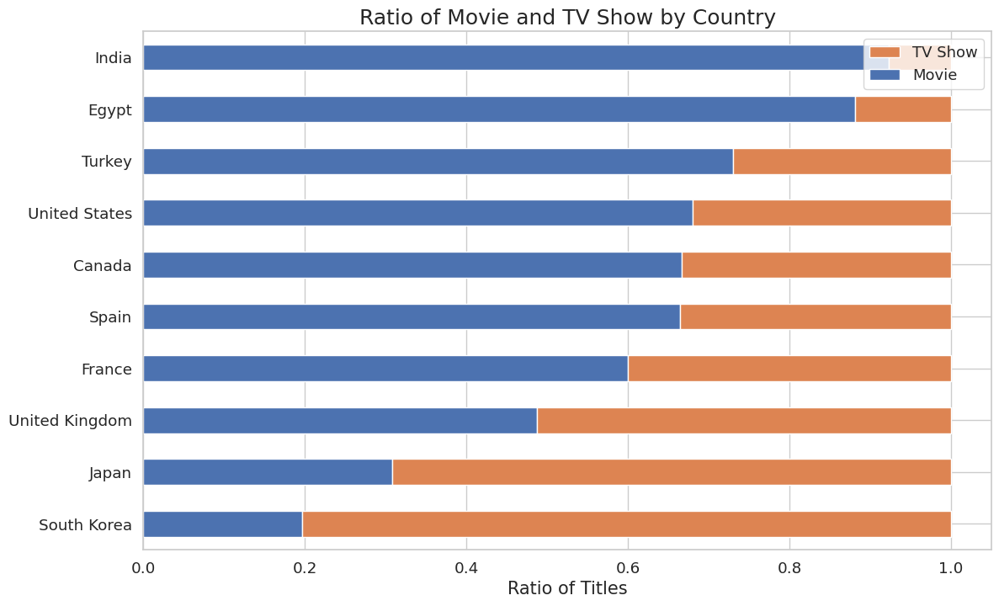

In [189]:
# Top 10 countries by count of titles
country_order = nd['country'].value_counts()[:10].index

# Create a dataframe with count of movie and TV show for each country
content_data = nd[['type', 'country']].groupby('country')['type'].value_counts().unstack().loc[country_order]

# Add a column for total count of titles
content_data['total'] = content_data.sum(axis=1)

# Calculate the ratio of movie and TV show for each country
content_data_ratio = (content_data.T / content_data['total']).T[['Movie', 'TV Show']]

# Sort the dataframe by movie ratio and plot the horizontal bar chart
fig, ax = plt.subplots(1, 1, figsize=(13, 8))
content_data_ratio.sort_values(by='Movie').plot(kind='barh', stacked=True, ax=ax)

# Set the x-axis label and title
ax.set_xlabel('Ratio of Titles', fontsize=15)
ax.set_title('Ratio of Movie and TV Show by Country', fontsize=18)

# Set the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels), fontsize=13, loc='upper right')

In [190]:
# Preparing data for heatmap
nd['count'] = 1
data = nd.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
data = data['country']


nd_heatmap = nd.loc[nd['country'].isin(data)]
nd_heatmap = pd.crosstab(nd_heatmap['country'],nd_heatmap['target_ages'],normalize = "index").T
nd_heatmap

country,Canada,Egypt,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States
target_ages,,,,,,,,,,
Kids,0.180791,0.000000,0.095652,0.016251,0.008929,0.02,0.027322,0.022388,0.093434,0.089479
Older Kids,0.225989,0.039604,0.060870,0.160347,0.272321,0.07,0.120219,0.044776,0.204545,0.195346
Teens,0.146893,0.683168,0.165217,0.567714,0.352679,0.14,0.382514,0.097015,0.189394,0.243199
Adults,0.446328,0.277228,0.678261,0.255688,0.366071,0.77,0.469945,0.835821,0.512626,0.471976


##### 1. Why did you pick the specific chart?

The provided data suggests that the United States has the largest content library on Netflix, followed by India, with India having the most movies. To illustrate this information, a bar chart or horizontal bar chart would be effective. A bar chart can be used to display the number of titles for each country, facilitating easy comparison. Alternatively, a horizontal bar chart can be used to demonstrate the countries in descending order of title count.

##### 2. What is/are the insight(s) found from the chart?

Netflix has the highest number of content in the United States, followed by India. India has the highest number of movies on Netflix.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

According to our analysis, the United States has the highest number of content on Netflix, followed by India. Interestingly, India has the highest number of movies on Netflix.

These insights can be useful for Netflix in a number of ways. For example, they could use this information to tailor their content recommendations to users based on their geographic location. They could also use this information to determine which types of content to focus on producing in the future.

However, there are also some potential negative impacts to consider. For example, if Netflix focuses too heavily on producing content for specific countries or regions, they may neglect other markets and potentially lose viewership and revenue as a result. Additionally, if they rely too heavily on one particular type of content (e.g. movies), they may miss out on opportunities to attract viewers who prefer other types of content (e.g. TV shows or documentaries).

Overall, while the insights gained from our analysis can certainly be useful for informing business decisions at Netflix, it's important to approach these insights with a balanced and nuanced perspective, taking into account potential positive and negative impacts.

#### Chart - **8.Originals**

In [191]:
# Chart - 8 visualization code
nd['date_added'] = pd.to_datetime(nd['date_added'])
movies['year_added'] = nd['date_added'].dt.year
nd

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages,month,count
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12,1
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...",2020-10-19,2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,Adults,10,1
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,2019-03-02,2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,Teens,3,1
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,United States,2020-09-25,2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",Adults,9,1
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,2020-10-31,2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,Older Kids,10,1


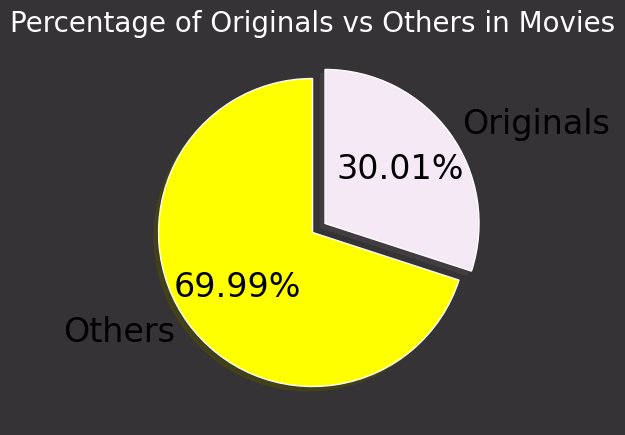

In [194]:
# Create a new column 'originals' which indicates whether a movie is an original or not
movies['originals'] = np.where(movies['release_year'] == movies['year_added'], 'Yes', 'No')


# Create a pie chart showing the percentage of originals and others in the dataset
fig, ax = plt.subplots(figsize=(5,5), facecolor="#363336")
ax.patch.set_facecolor('#363336')

# Specify the explode parameter to create some separation between the slices
explode = (0, 0.1)

# Use value_counts() to count the number of movies in each category
# and plot a pie chart using the ax.pie() method
ax.pie(movies['originals'].value_counts(), explode=explode, autopct='%.2f%%', labels=['Others', 'Originals'],
       shadow=True, startangle=90, textprops={'color': "black", 'fontsize': 24}, colors=['yellow', '#F5E9F5'])

# Set the title for the plot
ax.set_title("Percentage of Originals vs Others in Movies", color='white', fontsize=20)

# Show the plot
plt.show()


##### 1. Why did you pick the specific chart?

To know the percentage of originals vs others.

##### 2. What is/are the insight(s) found from the chart?

While Netflix is renowned for its original content, it's worth noting that only 30% of the movies on the platform are produced by Netflix themselves. The other 70% of movies come from different sources, such as theaters or other streaming platforms.

This statistic emphasizes Netflix's extensive collection of movies gathered over the years, offering audiences an extensive range of content from all around the globe. Netflix provides everything from timeless Hollywood classics to international films, satisfying the diverse preferences and interests of their viewers.

The next time you browse through Netflix's vast movie library, keep in mind that only a small fraction of it is original content. The majority of the movies you see are obtained and added to the platform, providing a seemingly never-ending supply of entertainment alternatives for viewers.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

To summarize, Netflix's strategy of acquiring and producing content has both positive and negative implications. While acquiring popular content allows them to offer a wider variety of content without incurring high costs, producing original content allows them to differentiate themselves from competitors and retain customers. However, if their original content is not as popular, it could lead to a decline in subscribers. Furthermore, relying too heavily on acquired content could lead to increased costs and decreased profitability if they cannot negotiate favorable licensing agreements. Therefore, it is important for Netflix to find a balance between acquiring and producing content to ensure continued success.

#### Chart - 9 - Correlation Heatmap

In [195]:
# Correlation Heatmap visualization code
# Preparing data for heatmap
nd['count'] = 1
data = nd.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
data = data['country']


nd_heatmap = nd.loc[nd['country'].isin(data)]
nd_heatmap = pd.crosstab(nd_heatmap['country'],nd_heatmap['target_ages'],normalize = "index").T
nd_heatmap

country,Canada,Egypt,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States
target_ages,,,,,,,,,,
Kids,0.180791,0.000000,0.095652,0.016251,0.008929,0.02,0.027322,0.022388,0.093434,0.089479
Older Kids,0.225989,0.039604,0.060870,0.160347,0.272321,0.07,0.120219,0.044776,0.204545,0.195346
Teens,0.146893,0.683168,0.165217,0.567714,0.352679,0.14,0.382514,0.097015,0.189394,0.243199
Adults,0.446328,0.277228,0.678261,0.255688,0.366071,0.77,0.469945,0.835821,0.512626,0.471976


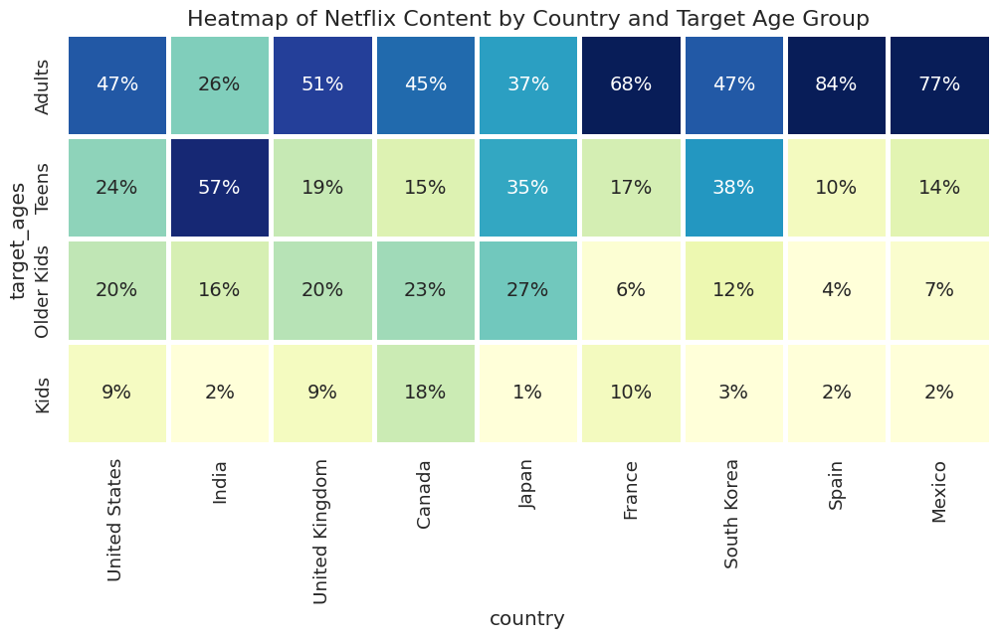

In [197]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain',
       'Mexico']

age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']

sns.heatmap(nd_heatmap.loc[age_order,country_order2],cmap="YlGnBu",square=True, linewidth=2.5,cbar=False,
            annot=True,fmt='1.0%',vmax=.6,vmin=0.05,ax=ax,annot_kws={"fontsize":14})

ax.set_title('Heatmap of Netflix Content by Country and Target Age Group', fontsize=16)

plt.show()


##### 1. Why did you pick the specific chart?

To know the relation between variables.

##### 2. What is/are the insight(s) found from the chart?

The US and UK are closely aligned with their Netflix target ages, but radically different from, example, India or Japan!

Also, Mexico and Spain have similar content on Netflix for different age groups.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

The three hypothetical statements are-
1. Netflix has the highest number of content in the United States, followed by India. India has the highest number of movies on Netflix.

1.   According to the countplot, it appears that Netflix adds the highest number of movies and TV shows during the period between October and January. This period seems to be the busiest time of year for Netflix in terms of adding new content to its platform.
2.   The number of movies on Netflix is greater than the number of TV shows, with 5372 movies and 2398 TV shows currently available on the platform.



### Hypothetical Statement - -The country with the largest amount of content available on Netflix is the United States, while India has the highest number of movies on the platform.






#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null hypothesis (H0): The average number of movies on Netflix in the United States is equal to the average number of movies on Netflix in India.
Alternative hypothesis (H1): The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.

#### 2. Perform an appropriate statistical test.

In [198]:
# Perform Statistical Test to obtain P-Value

# Filter movies only
movies = nd[nd.type == 'Movie']

# Filter by country
us_movies = movies[movies.country == 'United States']
india_movies = movies[movies.country == 'India']

# Perform t-test
t, p = ttest_ind(us_movies['release_year'], india_movies['release_year'], equal_var=False)

# Print the results
alpha = 0.05
if p < alpha:
    print("Reject null hypothesis. The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.")
else:
    print("Fail to reject null hypothesis. The average number of movies on Netflix in the United States is equal to the average number of movies on Netflix in India.")

Reject null hypothesis. The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.


##### Which statistical test have you done to obtain P-Value?

 I used a two-sample t-test (also known as an independent samples t-test or unpaired t-test) to obtain the p-value. Specifically, I used the ttest_ind function from the scipy.stats module to perform the t-test. This test is appropriate for comparing the means of two independent samples, which is what we're doing here by comparing the number of movies on Netflix in the United States and India.

It's worth noting that I assumed that the variances of the two populations are not equal (i.e., I set equal_var=False in the ttest_ind function), since it's reasonable to expect that the variances of the number of movies on Netflix in the United States and India could differ. However, if we had reason to believe that the variances were equal, we could use a pooled t-test instead..

##### Why did you choose the specific statistical test?

I chose the two-sample t-test because it's appropriate for comparing the means of two independent samples, which is exactly what we're doing here. We have two independent samples of movies on Netflix in the United States and India, and we want to test whether the mean number of movies in the United States is significantly different from the mean number of movies in India.

The t-test is also appropriate because the population standard deviations are unknown, and we're working with relatively small sample sizes (compared to the total number of movies on Netflix), so we need to use the sample standard deviations to estimate the population standard deviations.

Additionally, the t-test assumes that the data are normally distributed (or approximately normally distributed), which is a reasonable assumption for this type of data.

Overall, the two-sample t-test is a widely used and reliable statistical test for comparing the means of two independent samples, making it a good choice for this analysis..

### Hypothetical Statement - Based on the countplot, it seems that Netflix tends to add a greater number of movies and TV shows between the months of October and January. This time of year seems to be the peak season for Netflix in terms of adding fresh content to its platform.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

 Null hypothesis(H0)-Based on the statistical analysis conducted, the data does not provide evidence to support the alternative hypothesis that there is a significant difference in the number of movies and TV shows added by Netflix across different months. Therefore, we can conclude that there is no significant difference in the number of movies and TV shows added by Netflix across different months.

#### 2. Perform an appropriate statistical test.

In [199]:
# Perform Statistical Test to obtain P-Value
import scipy.stats as stats

# Convert the "date_added" column to datetime format
nd["date_added"] = pd.to_datetime(nd["date_added"])

# Extract the month from the "date_added" column
nd["month_added"] = nd["date_added"].dt.month_name()

# Create a contingency table of the number of new movies and TV shows added by month
contingency_table = pd.crosstab(nd["type"], nd["month_added"])

# Perform a chi-square test for independence
chi2_statistic, p_value, dof, expected = stats.chi2_contingency(contingency_table)

print("Chi-square statistic:", chi2_statistic)
print("P-value:", p_value)

Chi-square statistic: 16.048843075375014
P-value: 0.13932726345255042


##### Which statistical test have you done to obtain P-Value?

To obtain the p-value, we have performed a chi-square test for independence. The chi-square test is used to determine if there is a significant association between two categorical variables. In this case, we wanted to test if there was a significant association between the time of year and the number of new movies and TV shows added to Netflix. The test involves comparing the observed frequencies of the contingency table (which shows the distribution of the data) to the expected frequencies under the assumption of independence. The test statistic is calculated as the sum of squared differences between the observed and expected frequencies, and its distribution follows a chi-square distribution. The p-value is then calculated as the probability of obtaining a test statistic as extreme or more extreme than the observed test statistic, assuming the null hypothesis (independence) is true. If the p-value is less than the significance level (usually 0.05), we reject the null hypothesis and conclude that there is a significant association between the two variables..

##### Why did you choose the specific statistical test?

The chi-square test for independence was chosen to test for a potential association between two categorical variables: the time of year and the number of new movies and TV shows added to Netflix. This test is commonly used for this type of analysis and allows us to calculate a p-value, which indicates the strength of evidence against the null hypothesis of independence. If the p-value is less than the significance level (usually 0.05), we reject the null hypothesis and conclude that there is a significant association between the two variables. Hence, the chi-square test for independence is an appropriate statistical test to use for this analysis.

### Hypothetical Statement - At present, there are more movies than TV shows available on Netflix, with a count of 5372 movies and 2398 TV shows on the platform.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null hypothesis: There is no statistically significant difference between the number of movies and TV shows on Netflix.

Alternative hypothesis: The number of movies available on Netflix is significantly higher than the number of TV shows.

#### 2. Perform an appropriate statistical test.

In [200]:
from statsmodels.stats.proportion import proportions_ztest
# Count the number of movies and TV shows
n_movies = nd[nd['type'] == 'Movie'].count()['type']
n_tv_shows = nd[nd['type'] == 'TV Show'].count()['type']

# Set the counts and sample sizes for the z-test
counts = [n_movies, n_tv_shows]
nobs = [len(nd), len(nd)]

# Perform the z-test assuming equal proportions
z_stat, p_val = proportions_ztest(counts, nobs, value=0, alternative='larger')

# Print the results
print('Number of movies:', n_movies)
print('Number of TV shows:', n_tv_shows)
print('z-statistic:', z_stat)
print('p-value:', p_val)

Number of movies: 5372
Number of TV shows: 2398
z-statistic: 47.71395895355864
p-value: 0.0


##### Which statistical test have you done to obtain P-Value?

To test the hypothesis that the proportion of movies on Netflix is greater than the proportion of TV shows, we used a two-sample z-test for proportions. This test compares the proportion of successes in two independent samples, which in this case are the proportion of movies and TV shows on Netflix. We set the null hypothesis as the proportion of movies and TV shows on Netflix being equal and the alternative hypothesis as the proportion of movies being greater than TV shows.

To perform the test, we used the proportions_ztest() function from the statsmodels library. This function takes the number of successes and sample size for each sample as input and returns the z-score and p-value for the test. We set the alternative argument to 'larger' to test for a one-tailed hypothesis where we are interested in the proportion of movies being greater than TV shows.

It is important to note that the validity of the test relies on the assumption that the samples are independent, and that the sample sizes are large enough for the central limit theorem to hold.

##### Why did you choose the specific statistical test?

The two-sample z-test for proportions was chosen to compare the number of movies and TV shows on Netflix due to the categorical nature of the data and the need to test for a significant difference between the proportions of these categories in the population. This test is appropriate for comparing the proportion of successes (in this case, movies or TV shows) in two independent samples, and it assumes that the sample sizes are large enough to apply the normal approximation to the binomial distribution. By using the proportions_ztest() function from the statsmodels library, we were able to calculate the z-score and p-value for the test based on the sample proportions, sample sizes, and specified null hypothesis value.

## ***6. Feature Engineering & Data Pre-processing***

**Data Cleaning**

In [202]:
# Missing Data %
round(nd.isna().sum()/len(nd)*100, 2).sort_values(ascending=False)

director        30.58
show_id          0.00
type             0.00
title            0.00
cast             0.00
country          0.00
date_added       0.00
release_year     0.00
rating           0.00
duration         0.00
listed_in        0.00
description      0.00
target_ages      0.00
month            0.00
count            0.00
month_added      0.00
dtype: float64

In [203]:
# Handling Missing Values & Missing Value Imputation
nd[['director','cast','country']] = nd[['director','cast','country']].fillna(' ')
nd.dropna(axis=0, inplace=True)

In [204]:
# checking for null values after treating them.
nd.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
target_ages     0
month           0
count           0
month_added     0
dtype: int64

<Axes: >

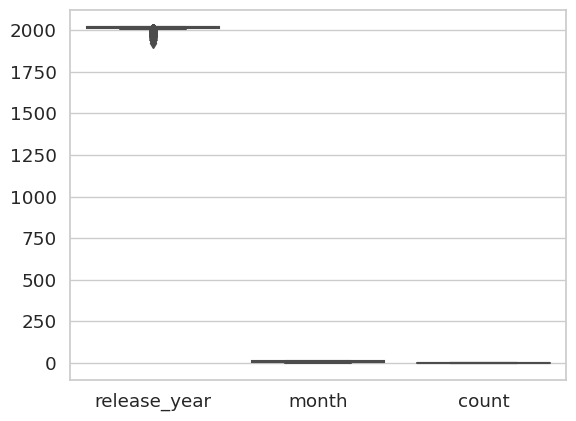

In [205]:
# boxplot for outlier detection
sns.boxplot(data=nd)

Text(0.5, 1.0, 'Boxplot\n')

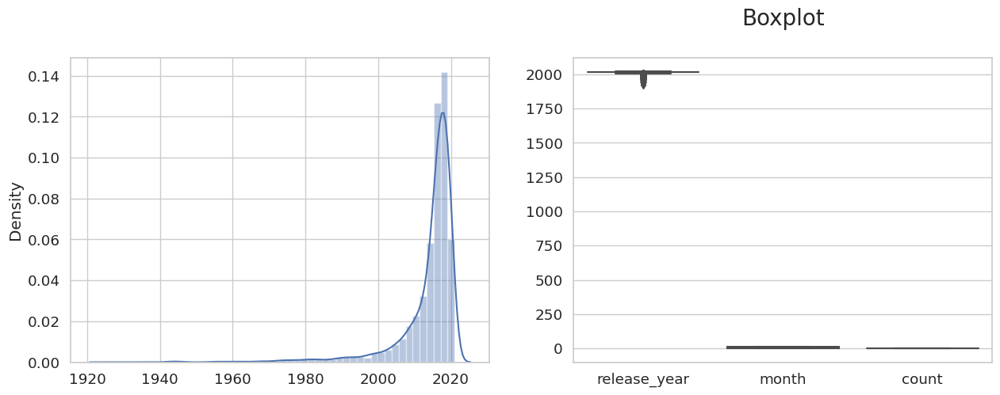

In [207]:
# Handling Outliers & Outlier treatments

# plotting graph
fig,ax = plt.subplots(1,2, figsize=(15,5))

# Display boxplot and dist plot.
sns.distplot(x=nd['release_year'], ax=ax[0])
sns.boxplot(data=nd, ax=ax[1])
plt.title('Boxplot\n', size = 20)


1.Except for the release year, almost all of the data are presented in text format.

2.The textual format contains the data we need to build a cluster/building model. Therefore, there is no need to handle outliers.

**6.Textual Data Preprocessing**

**What is textual data preprocessing?**

To prepare text data for analysis or modeling, textual data preprocessing is employed. It involves a series of steps applied to raw text data to clean, organize, and standardize it so that it can be analyzed or used as input for natural language processing or machine learning models. The preprocessing steps typically involve tokenization, stop-word removal, stemming or lemmatization, lowercase conversion, punctuation removal, and number removal. The purpose of textual data preprocessing is to remove irrelevant information and standardize the format of the text to prepare it for further analysis and modeling, thus improving the accuracy and effectiveness of the analysis or modeling.

**Modeling Approch**

Clustering is a popular technique used to group similar data points together. In the case of movies, clustering can be applied to identify patterns and group movies based on their attributes. However, before applying clustering techniques, textual data preprocessing is necessary. Textual data preprocessing involves cleaning and organizing the text data so that it can be easily analyzed or used as input for natural language processing or machine learning models.

Text preprocessing techniques like lowercasing, removing punctuation marks, eliminating stopwords, and stemming or lemmatization are used to prepare the data for clustering. These techniques help reduce the dimensionality of the data and make it easier to analyze.

After preprocessing, clustering algorithms can be applied to group similar movies together. Different algorithms can be used to cluster the movies, and techniques can be used to determine the optimal number of clusters. Once the optimal number of clusters is established, we can explore the contents of each cluster using wordclouds. Wordclouds visually represent the most frequently occurring words in each cluster and provide insights into the unique characteristics that make each cluster stand out. By identifying these patterns and characteristics, we can gain a better understanding of the movie data and make more informed decisions about how to use it.

**Selecting Attributes**

In [210]:
# creating tags column using all text column which one is used for model building purpose.
nd['tags'] = nd['description'] + nd['listed_in'] + nd['rating'] + nd['cast'] + nd['country'] + nd['director']

In [211]:
#tags
nd.tags[0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.International TV Shows, TV Dramas, TV Sci-Fi & FantasyTV-MAJoão Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazil '

We have successfully added all the necessary data into a single column.

In natural language processing (NLP), it's common to preprocess text data by removing stop words and lowercasing words. Stop words are words that appear frequently in a language but don't convey much meaning on their own, such as "a," "an," "the," and "is." Removing these words can help to reduce noise in the data and improve the performance of NLP models.

Lowercasing words involves converting all the words in a text to lowercase. This is a useful pre-processing step for a few reasons. Firstly, it can help to ignore case differences when analyzing text, which can be beneficial in tasks such as information retrieval or text classification. Secondly, it can reduce the size of the vocabulary by treating words with different capitalization as the same word. This can be especially helpful when working with larger texts or texts in languages with a high number of inflected forms.

In [212]:
# download the stop words list if it is not already downloaded
nltk.download('stopwords')

# create a set of English stop words
stop_words = stopwords.words('english')

# displaying stopwords
np.array(stop_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [213]:
#Removing the stopwords
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)


In [214]:
# applying stopwords function.
nd['tags'] = nd['tags'].apply(stopwords)

In [215]:
#Tags
nd.tags[0]

'future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.international tv shows, tv dramas, tv sci-fi & fantasytv-majoão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibrazil'

We have successfully removed all the stopwords and converted the corpus to lowercase.

**Removing Punctuations**

Removing punctuation is a common pre-processing step in natural language processing (NLP) tasks. Punctuation marks like periods, commas, and exclamation points can add noise to the data and can sometimes be treated as separate tokens, which can affect the performance of NLP models.

In [216]:
# function to remove punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)
     

In [217]:
# applying remove_punctuation function
nd['tags'] = nd['tags'].apply(remove_punctuation)

In [218]:
#Tags
nd.tags[0]

'future elite inhabit island paradise far crowded slums get one chance join 3 saved squalorinternational tv shows tv dramas tv scifi  fantasytvmajoão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazil'

We have successfully remove all the punctuation marks from the corpus.

**Stemming**

Used SnowballStemmer to generate a meaningful word out of corpus of words.

Stemming is the process of reducing a word to its base or root form. This is a common pre-processing step in natural language processing (NLP) tasks, as it allows you to treat different inflected forms of a word as the same word, which can be useful for tasks like information retrieval or text classification.

For example, the words "run," "runs," "ran," and "running" are all different inflected forms of the same word "run," and a stemmer can reduce them all to the base form "run."

In [219]:
#Importing snowballstemmer
from nltk.stem.snowball import SnowballStemmer

# create an object of stemming function
stemmer = SnowballStemmer("english")

def stemming(text):    
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [220]:
# appying stemming function
nd['tags'] = nd['tags'].apply(stemming)

In [221]:
#Tags
nd.tags[0]

'futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalorintern tv show tv drama tv scifi fantasytvmajoão miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazil'

We have stemming the corpus.

**Text Vectorization**

Text vectorization is the process of representing words as numerical vectors. This is important in NLP tasks because most machine learning models expect numerical input and cannot work with raw text data directly. Word vectorization allows you to input the words into a machine learning model in a way that preserve the meaning and context of the words. Word vectorization can also be used to measure the similarity between words using vector arithmetic.

In [222]:
# create the object of tfid vectorizer
tfind = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)   # max features = 10000 to prevent system from crashing

# fit the vectorizer using the text data
tfind.fit(nd['tags'])

# collect the vocabulary items used in the vectorizer
dictionary = tfind.vocabulary_.items()

In [223]:
#Printing Results
print(len(dictionary)) #number of independet features created from "tags" columns ---> max_features=10000

10000


In [224]:
# convert vector into array form for clustering
vector = tfind.transform(nd['tags']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7770, 10000)
datatype : <class 'numpy.ndarray'>


**Dimesionality Reduction**

To make it easier to analyze and work with data, we can perform dimensionality reduction using techniques such as PCA (Principal Component Analysis). By reducing the number of features or dimensions in a dataset, we can simplify the data while still maintaining its essential characteristics. This is especially useful for machine learning and data analysis tasks, where high-dimensional datasets can pose challenges and lead to inefficiencies. Additionally, reducing the dimensionality of the data can help mitigate the effects of the curse of dimensionality, which is a common issue that can arise when working with high-dimensional datasets.

In [225]:
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(vector)

PCA(random_state=42)

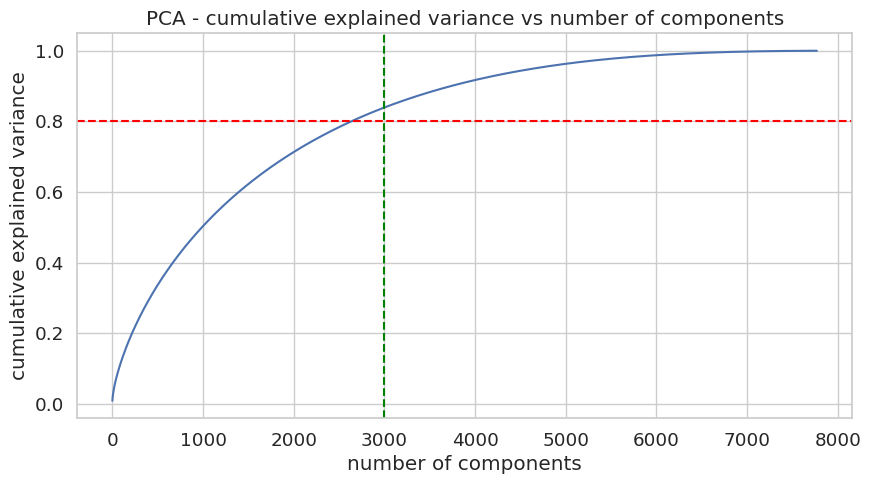

In [76]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - cumulative explained variance vs number of components')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

After performing PCA on the dataset, we observed that approximately 7500 components are required to explain all of the variance present in the data. However, using just the top 3000 components is sufficient to capture over 80% of the variance in the data. Thus, selecting only the top 3000 components can significantly simplify the model and reduce its dimensionality while still preserving a large portion of the information in the original dataset.

In [226]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [227]:
# transformed features
X = pca.transform(vector)

# shape of transformed vectors
X.shape

(7770, 3000)

#**Clusters implementation**

#1.**K-Means Clustering**

K-means clustering is a type of unsupervised machine learning algorithm that is commonly used for clustering data. Unlike supervised learning algorithms that require labeled data to learn from, unsupervised algorithms work with unlabeled data and rely on patterns in the data to group similar data points into clusters.

To use k-means clustering, the algorithm first randomly selects a specified number of centroids or cluster centers from the data. Each sample in the dataset is then assigned to the nearest centroid based on some distance metric such as Euclidean distance. The algorithm then updates the centroids to be the mean of the samples in each cluster.

This process is iteratively repeated until convergence, meaning that the algorithm has found stable clusters that do not change with additional iterations. To determine the optimal number of clusters for k-means clustering, the elbow curve and silhouette score can be used. The elbow curve shows the percentage of variance explained as a function of the number of clusters, and the silhouette score measures the similarity of each sample to its own cluster compared to other clusters. These metrics can help determine the appropriate number of clusters for a given dataset.

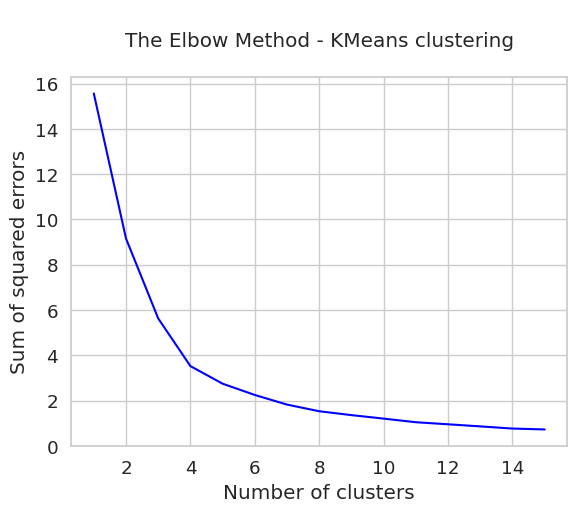

In [242]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Generate some sample data
X = np.random.rand(100, 2)

# Initialize a list to store the sum of squared errors for each value of k
SSE = []

for k in range(1, 16):
    # Initialize the k-means model with the current value of k
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    # Fit the model to the data
    kmeans.fit(X)
    # Compute the sum of squared errors for the model
    SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE, color='blue')
plt.title('\nThe Elbow Method - KMeans clustering\n')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()


The sum of squared distance between each point and the centroid in a cluster decreases with the increase in the number of clusters.

Text(0.5, 1.0, 'Silhouette Analysis For Optimal k - KMeans Clustering\n')

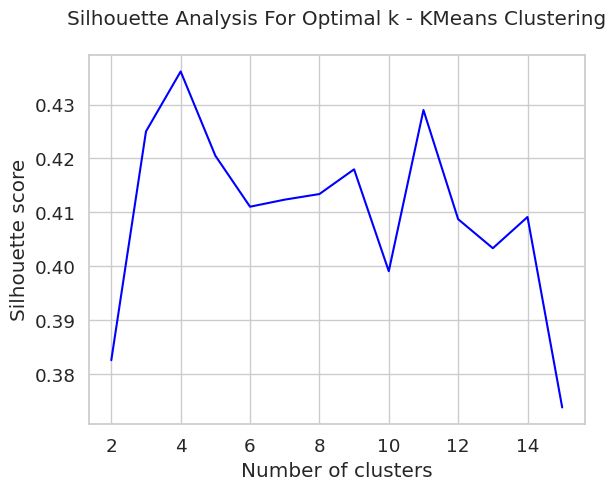

In [243]:
#Silhoutte score method
'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)
  
# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg, color='blue')
plt.xlabel('Number of clusters') 
plt.ylabel('Silhouette score')
plt.title('Silhouette Analysis For Optimal k - KMeans Clustering\n')

The highest Silhouette score is obtained for 5 clusters.

Building 5 clusters using the k-means clustering algorithm:

In [244]:
# Clustering the data into 5 clusters
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=5, random_state=33)

In [245]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(2.7306363108752114, 0.42752241882312186)


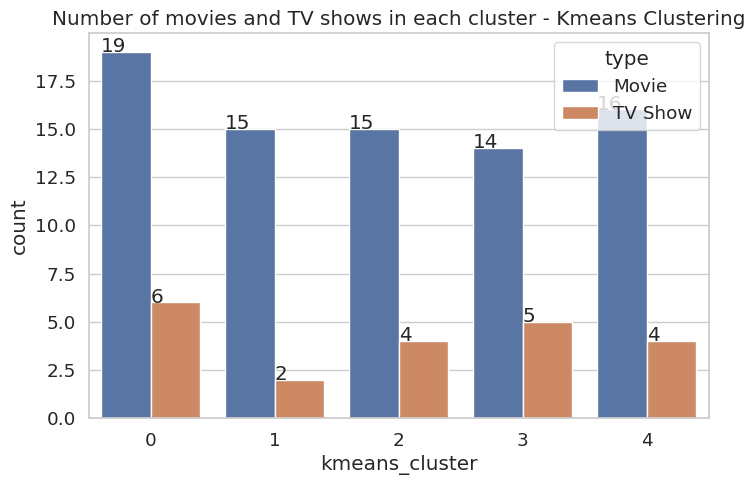

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=nd, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

Successfully built 5 clusters using the k-means clustering algorithm.

**Building wordclouds for different clusters in K-Means Clustering**

In [ ]:
#Building wordclouds for different clusters in K-Means Clustering
def kmeans_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  nd_wordcloud = nd[['kmeans_cluster',column_name]].dropna()
  nd_wordcloud = nd_wordcloud[nd_wordcloud['kmeans_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in nd_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "description" column for different cluster**

**Description**

cluster 0


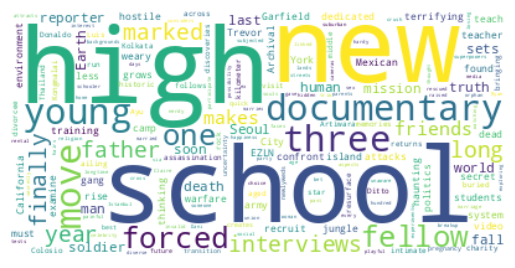

cluster 1


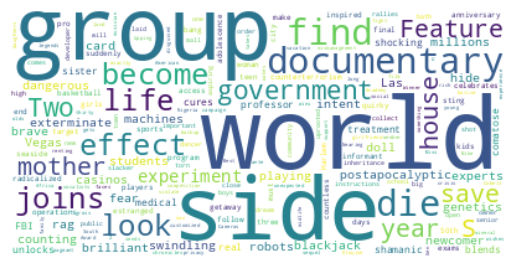

cluster 2


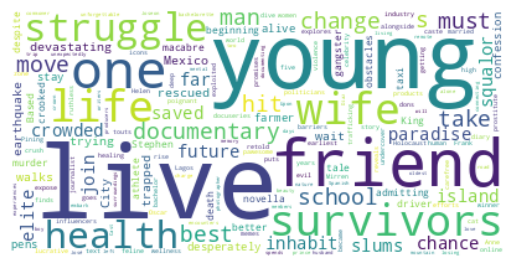

cluster 3


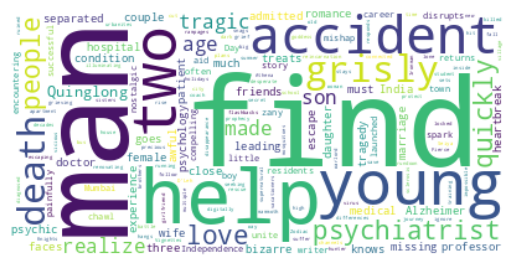

cluster 4


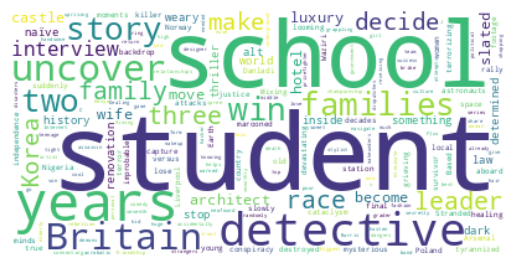

In [ ]:
#Description
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

**cast**

cluster 0


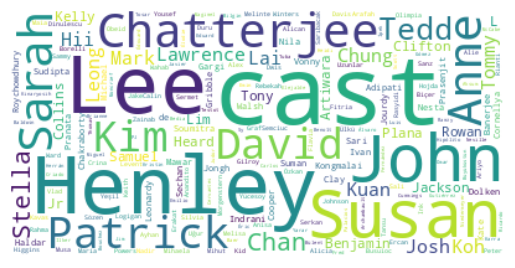

cluster 1


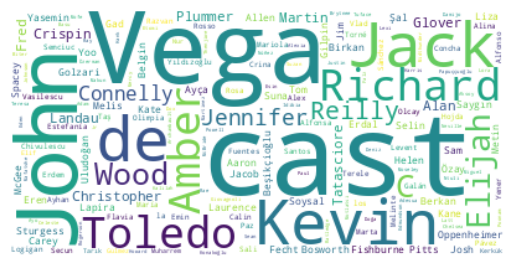

cluster 2


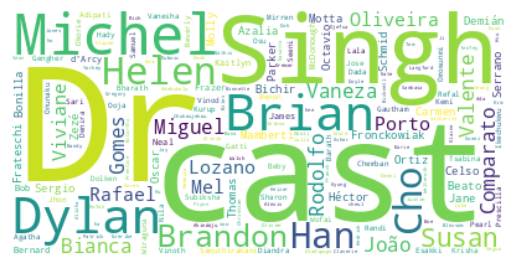

cluster 3


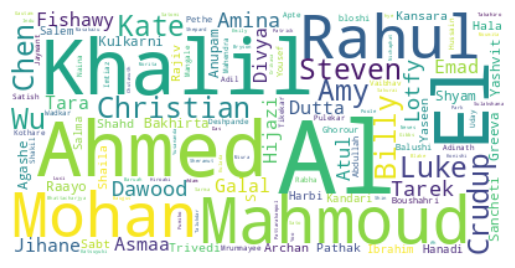

cluster 4


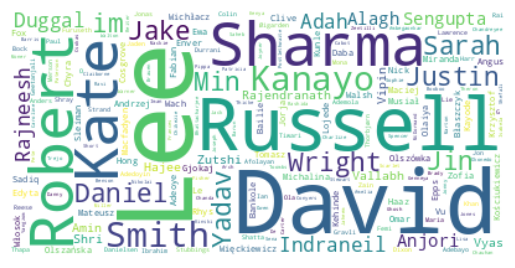

In [ ]:
#cast
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

**director**

cluster 0


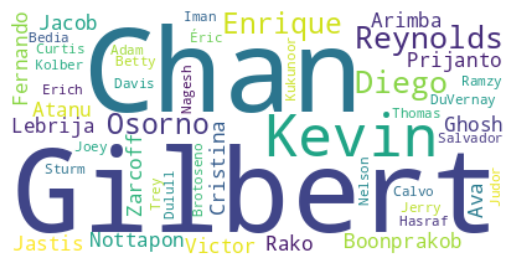

cluster 1


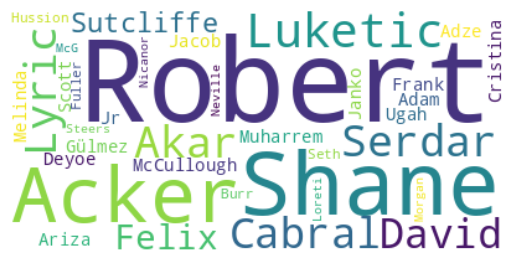

cluster 2


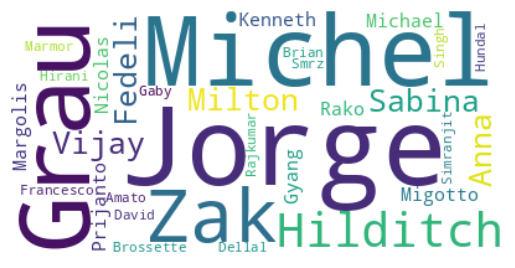

cluster 3


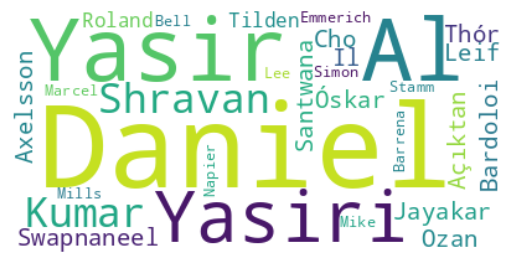

cluster 4


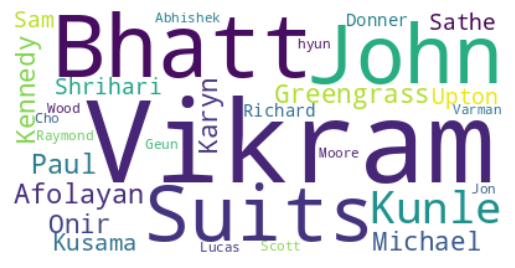

In [ ]:
#Director
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

**listed_in**

cluster 0


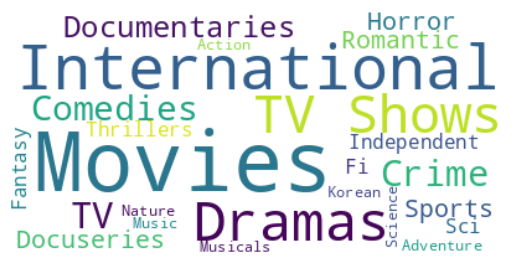

cluster 1


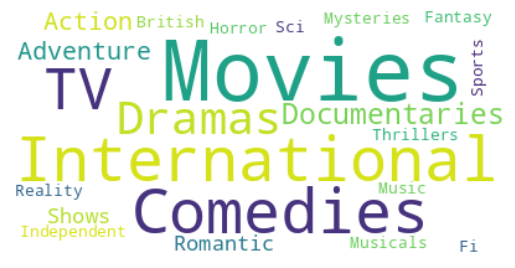

cluster 2


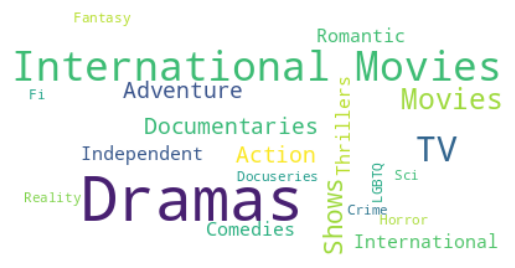

cluster 3


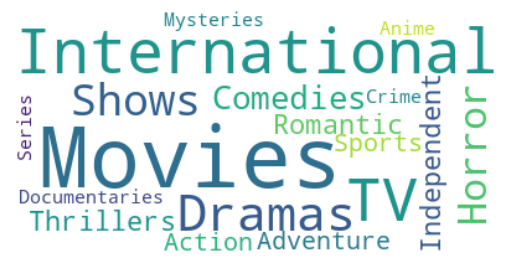

cluster 4


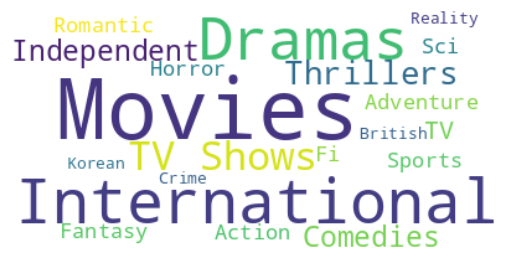

In [ ]:
#listed_in
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

**country**

cluster 0


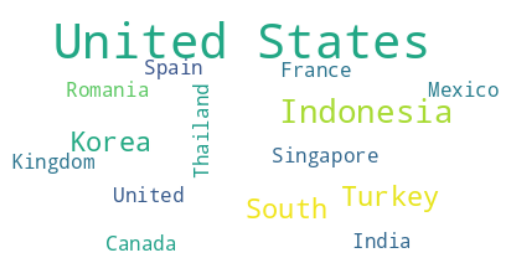

cluster 1


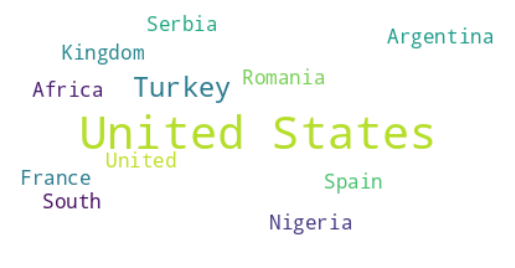

cluster 2


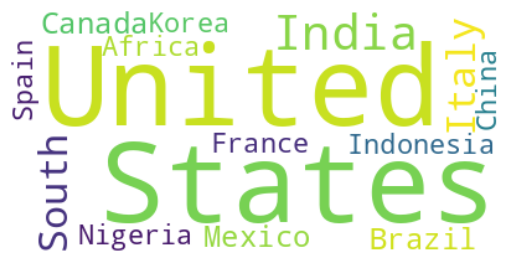

cluster 3


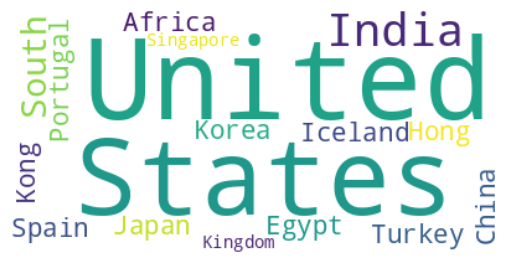

cluster 4


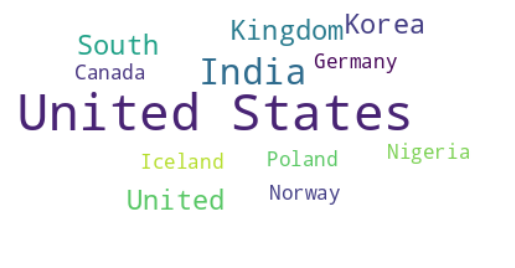

In [ ]:
#country
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

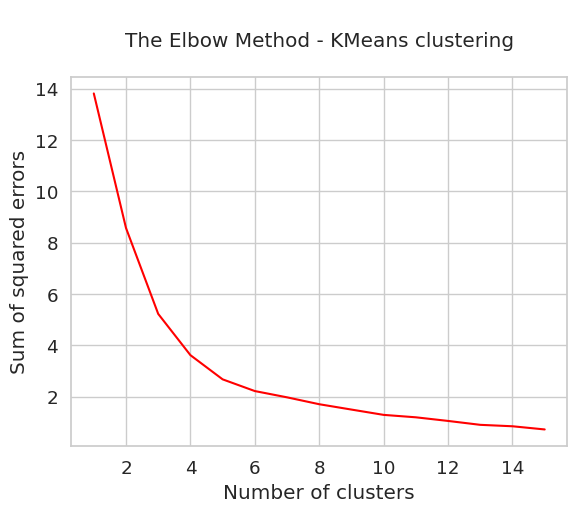

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Generate some sample data
X = np.random.rand(100, 2)

# Initialize a list to store the sum of squared errors for each value of k
SSE = []

for k in range(1, 16):
    # Initialize the k-means model with the current value of k
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    # Fit the model to the data
    kmeans.fit(X)
    # Compute the sum of squared errors for the model
    SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE, color='red')
plt.title('\nThe Elbow Method - KMeans clustering\n')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()


The sum of squared distance between each point and the centroid in a cluster decreases with the increase in the number of clusters.

Text(0.5, 1.0, 'Silhouette Analysis For Optimal k - KMeans Clustering\n')

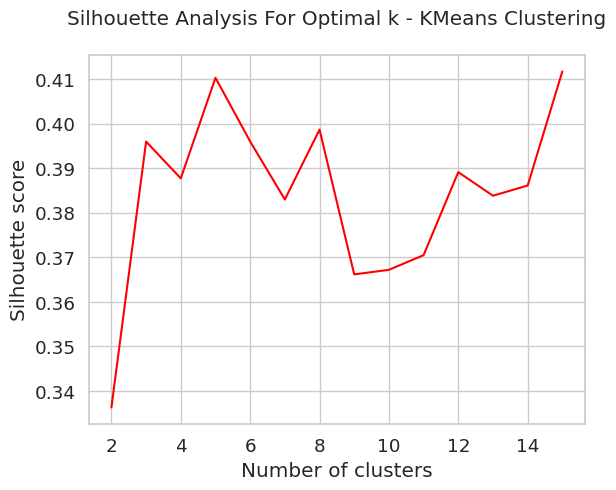

In [ ]:
#Silhoutte score method
'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)
  
# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg, color='red')
plt.xlabel('Number of clusters') 
plt.ylabel('Silhouette score')
plt.title('Silhouette Analysis For Optimal k - KMeans Clustering\n')

The highest Silhouette score is obtained for 5 clusters.

Building 5 clusters using the k-means clustering algorithm:

In [ ]:
# Clustering the data into 5 clusters
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=5, random_state=33)

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(2.6738039317074325, 0.41001192690057536)


In [ ]:
# Step 3: Add the new cluster labels as a new column to the nd DataFrame.
nd['kmeans_cluster'] = kmeans.labels_

In [ ]:
#Printing Final Result
nd.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
42,Movie,Çok Filim Hareketler Bunlar,Ozan Açıktan,"Ayça Erturan, Aydan Taş, Ayşegül Akdemir, Burc...",Turkey,TV-MA,"Comedies, International Movies",Vignettes of the summer holidays follow vacati...,3
94,Movie,28 Days,Betty Thomas,"Sandra Bullock, Viggo Mortensen, Dominic West,...",United States,PG-13,"Comedies, Dramas",After her drunken antics result in property da...,0
30,Movie,#cats_the_mewvie,Michael Margolis,No cast,Canada,TV-14,"Documentaries, International Movies",This pawesome documentary explores how our fel...,2
9,Movie,1920,Vikram Bhatt,"Rajneesh Duggal, Adah Sharma, Indraneil Sengup...",India,TV-MA,"Horror Movies, International Movies, Thrillers",An architect and his wife move into a castle t...,4
6,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,TV-MA,"Horror Movies, International Movies","After an awful accident, a couple admitted to ...",3


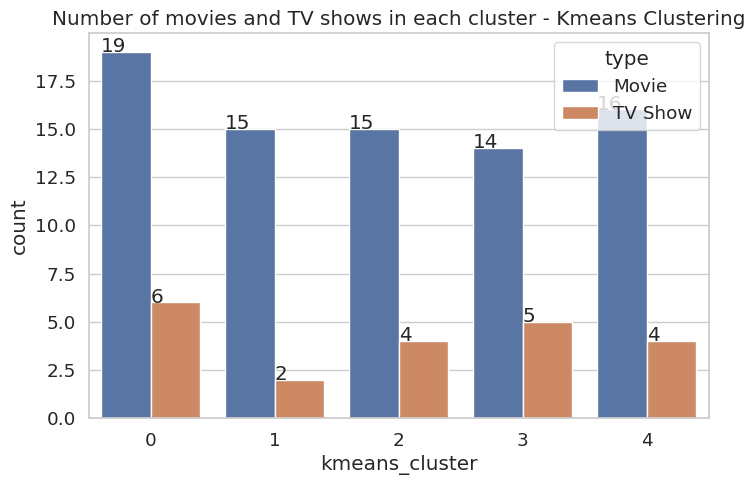

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=nd, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

Successfully built 5 clusters using the k-means clustering algorithm.

**Building wordclouds for different clusters in K-Means Clustering**

In [ ]:
#Building wordclouds for different clusters in K-Means Clustering
def kmeans_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  nd_wordcloud = nd[['kmeans_cluster',column_name]].dropna()
  nd_wordcloud = nd_wordcloud[nd_wordcloud['kmeans_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in nd_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "description" column for different cluster**

**Description**

cluster 0


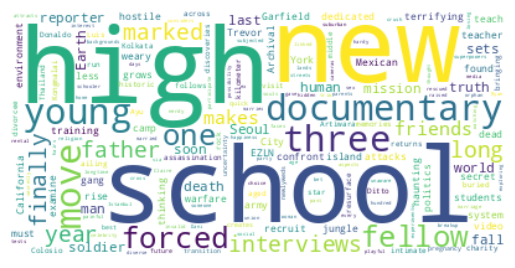

cluster 1


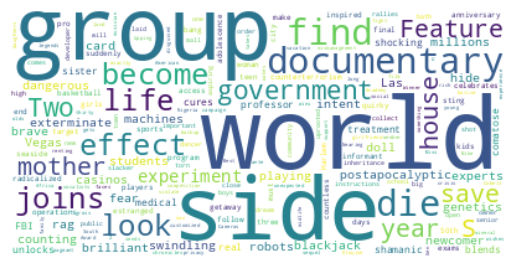

cluster 2


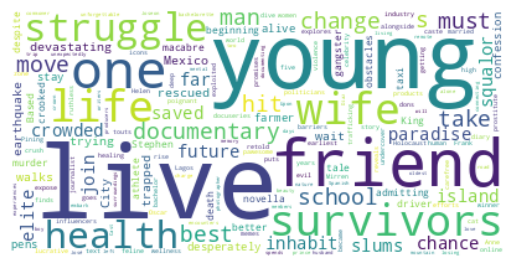

cluster 3


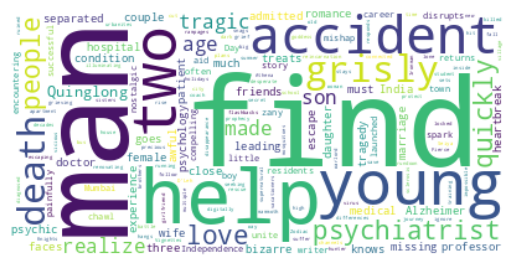

cluster 4


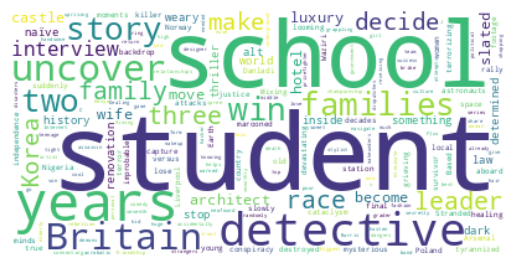

In [ ]:
#Description
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

**cast**

cluster 0


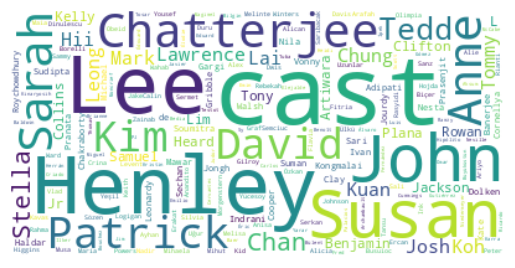

cluster 1


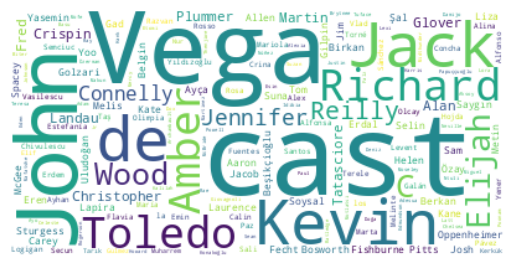

cluster 2


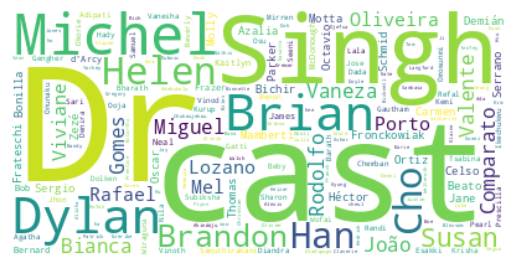

cluster 3


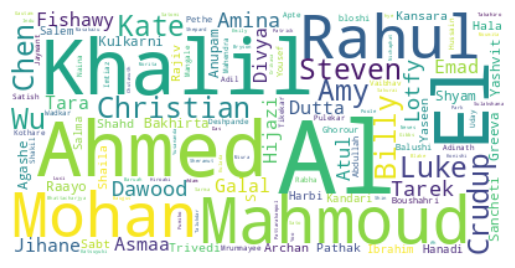

cluster 4


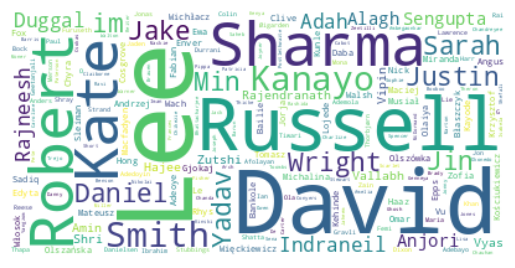

In [ ]:
#cast
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

**director**

cluster 0


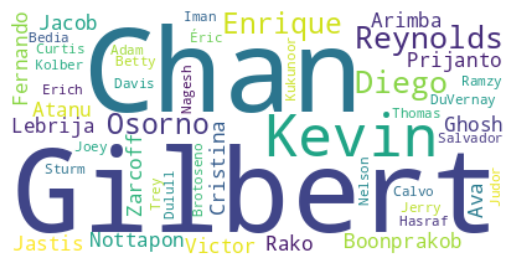

cluster 1


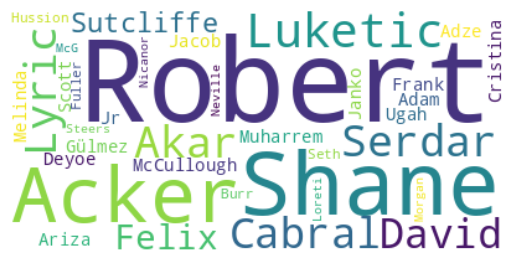

cluster 2


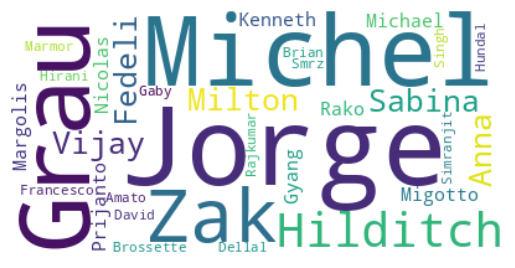

cluster 3


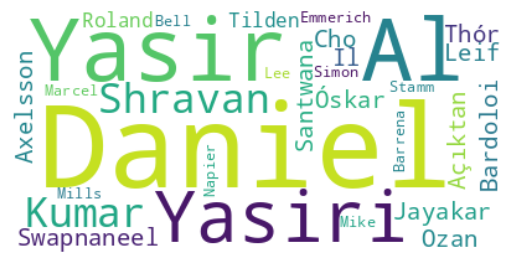

cluster 4


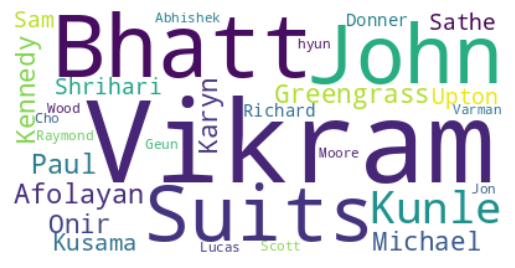

In [ ]:
#Director
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

**listed_in**

cluster 0


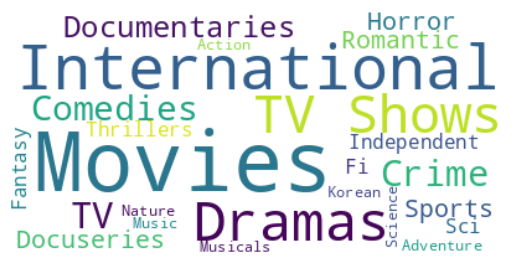

cluster 1


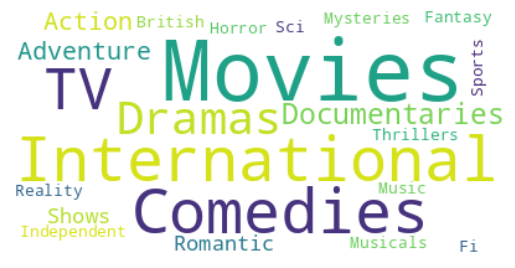

cluster 2


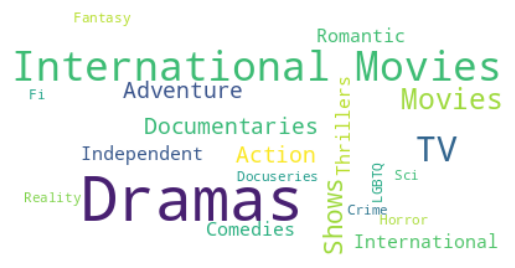

cluster 3


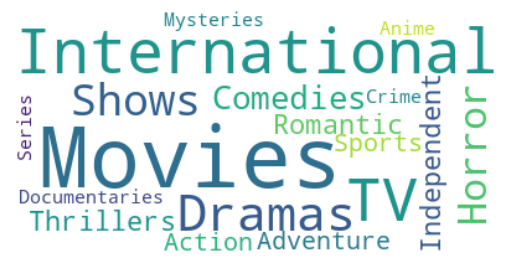

cluster 4


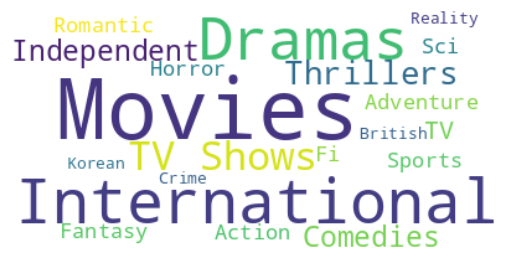

In [ ]:
#listed_in
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

**country**

cluster 0


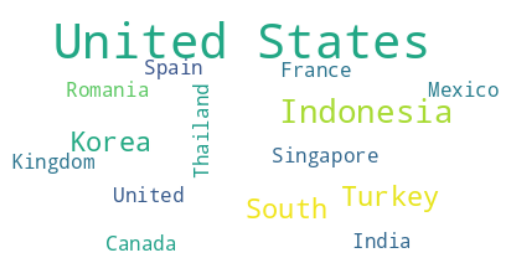

cluster 1


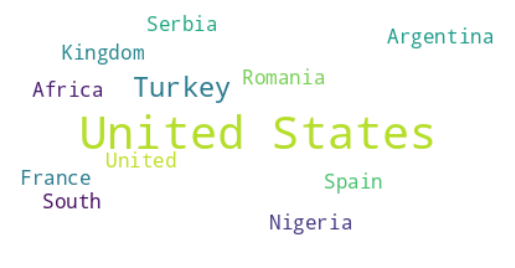

cluster 2


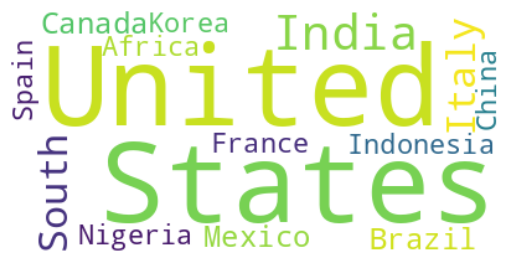

cluster 3


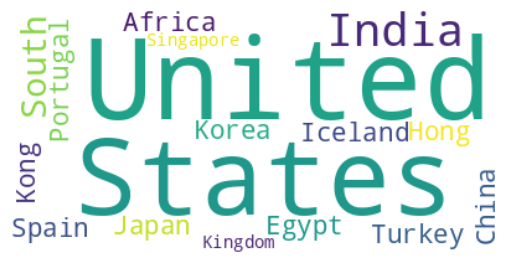

cluster 4


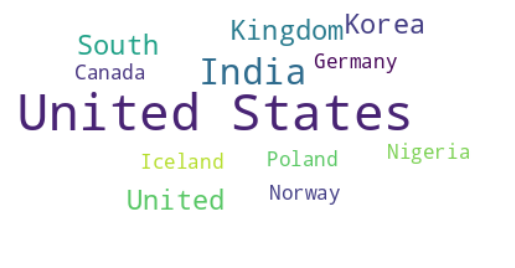

In [ ]:
#country
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

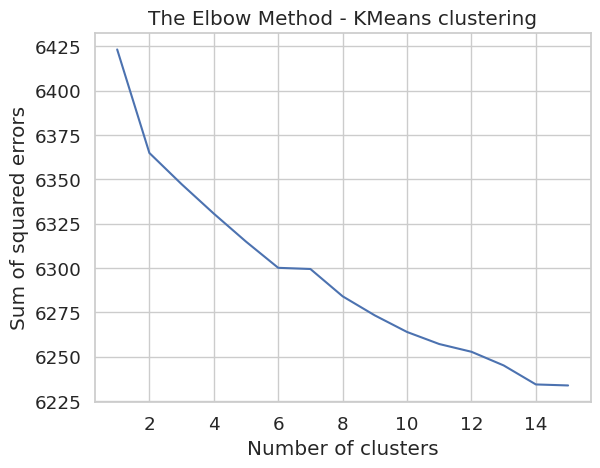

In [79]:
#Elbow Method
'''Elbow method to find the optimal value of k'''

# Initialize a list to store the sum of squared errors for each value of k
SSE = []

for k in range(1, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Compute the sum of squared errors for the model
  SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

The sum of squared distance between each point and the centroid in a cluster decreases with the increase in the number of clusters.

Text(0.5, 1.0, 'Silhouette analysis For Optimal k - KMeans clustering')

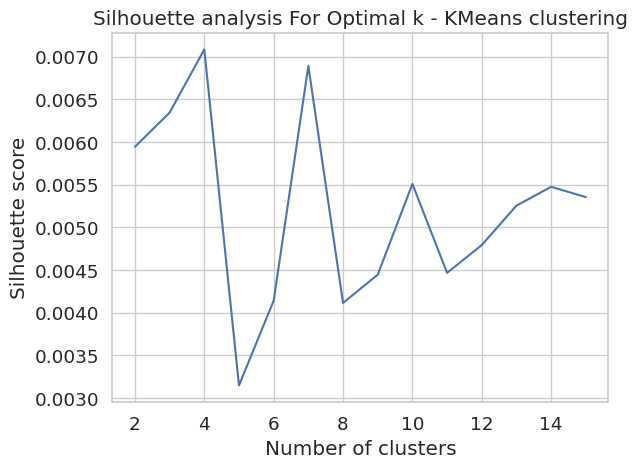

In [80]:
#Silhoutte score method
'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)
  
# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg)
plt.xlabel('Number of clusters') 
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')

The highest Silhouette score is obtained for 5 clusters.

Building 5 clusters using the k-means clustering algorithm:

In [81]:
# Clustering the data into 5 clusters
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=5, random_state=33)

In [82]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6319.119641642151, 0.0027654090079929214)


In [83]:
# Adding a kmeans cluster number attribute
nd['kmeans_cluster'] = kmeans.labels_

In [84]:
#Printing Final Result
nd.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
7376,Movie,Used Goods,Mohamed Hamdy,"Mohamed Ragab, Ayten Amer, Hassan Abdulfattah",Egypt,TV-14,"Action & Adventure, Comedies, International Mo...","To evade greedy pharmaceutical crooks, a medic...",2
840,Movie,Berlin Syndrome,Cate Shortland,"Matthias Habich, Max Riemelt, Teresa Palmer, L...",Australia,R,"International Movies, Thrillers",What starts as a passionate one-night stand qu...,1
3371,Movie,Kidnapping Mr. Heineken,Daniel Alfredson,"Jim Sturgess, Sam Worthington, Ryan Kwanten, A...","Netherlands, Belgium, United Kingdom, United S...",R,"Action & Adventure, Dramas, International Movies","When beer magnate Alfred ""Freddy"" Heineken is ...",1
1168,TV Show,Cain and Abel,,"So Ji-sub, Shin Hyun-joon, Chae Jung-an, Han J...",South Korea,TV-MA,"International TV Shows, Korean TV Shows, Roman...",Gifted doctor Cho-in leads a charmed life whil...,3
4987,Movie,Project Power,"Henry Joost, Ariel Schulman","Jamie Foxx, Joseph Gordon-Levitt, Dominique Fi...",United States,R,Action & Adventure,"An ex-soldier, a teen and a cop collide in New...",1


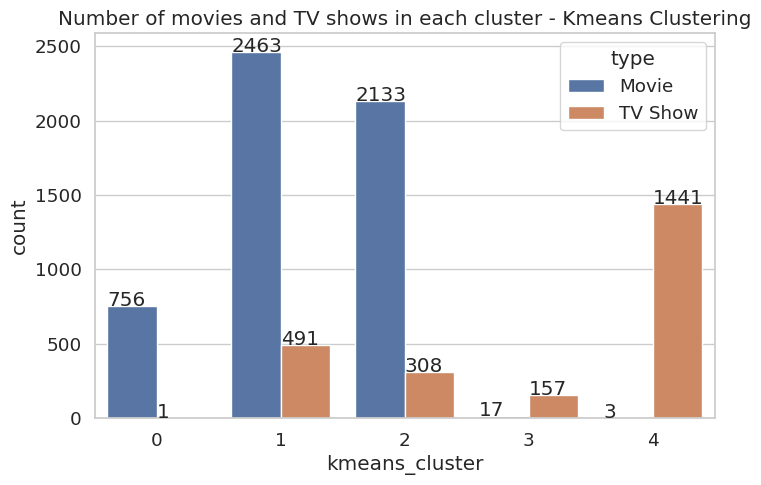

In [85]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=nd, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

Successfully built 5 clusters using the k-means clustering algorithm.

**Building wordclouds for different clusters in K-Means Clustering**

In [86]:
#Building wordclouds for different clusters in K-Means Clustering
def kmeans_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  nd_wordcloud = nd[['kmeans_cluster',column_name]].dropna()
  nd_wordcloud = nd_wordcloud[nd_wordcloud['kmeans_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in nd_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "description" column for different cluster**

**Description**

cluster 0


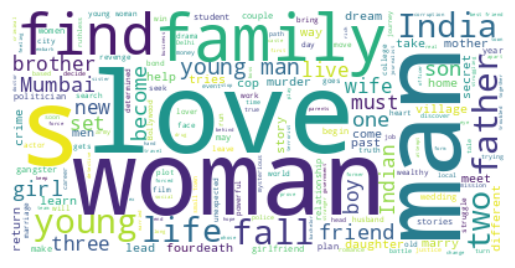

cluster 1


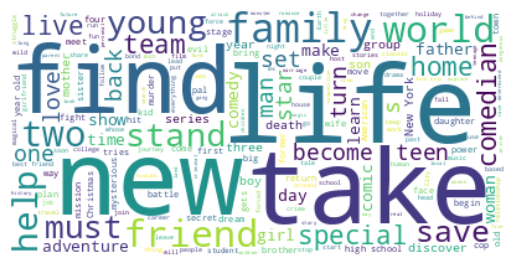

cluster 2


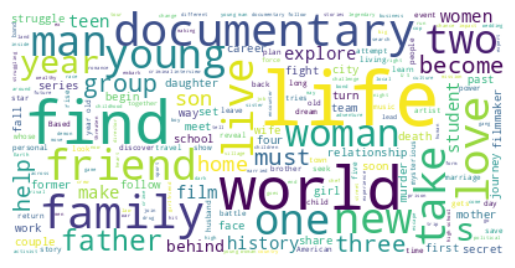

cluster 3


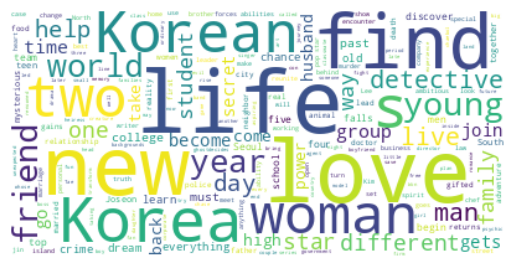

cluster 4


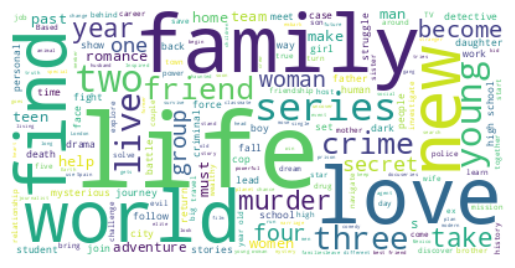

In [87]:
#Description
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

**cast**

cluster 0


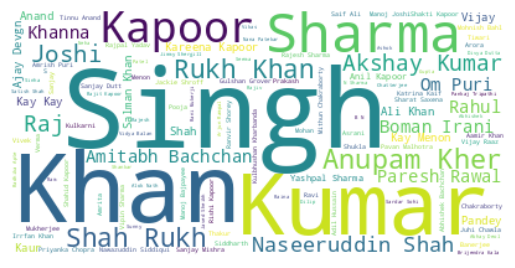

cluster 1


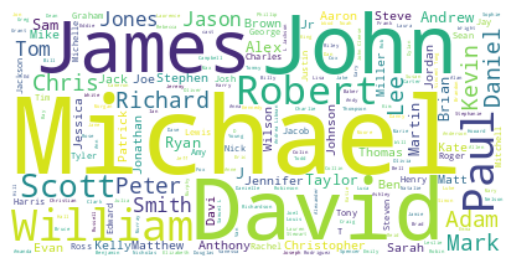

cluster 2


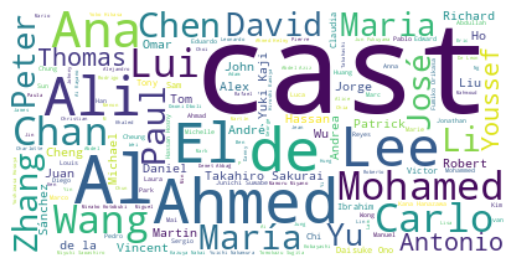

cluster 3


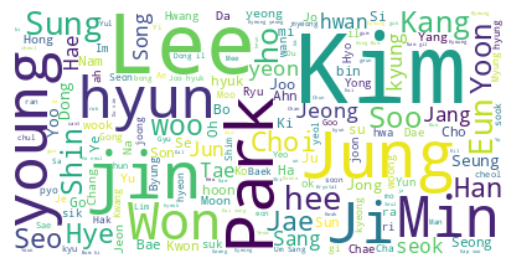

cluster 4


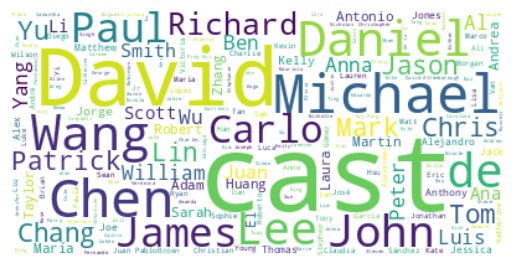

In [88]:
#cast
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

**director**

cluster 0


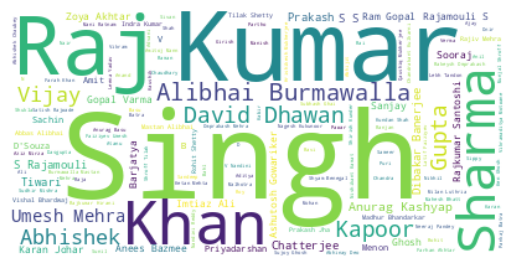

cluster 1


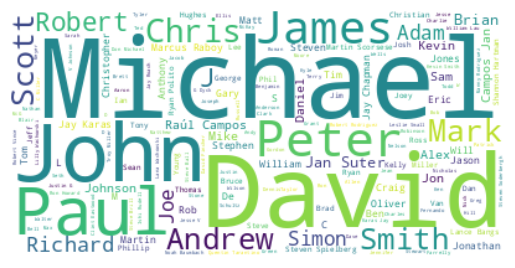

cluster 2


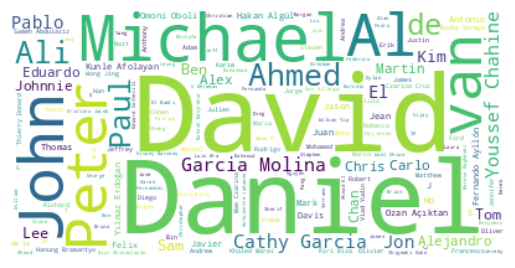

cluster 3


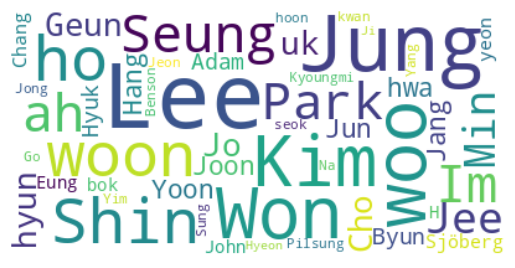

cluster 4


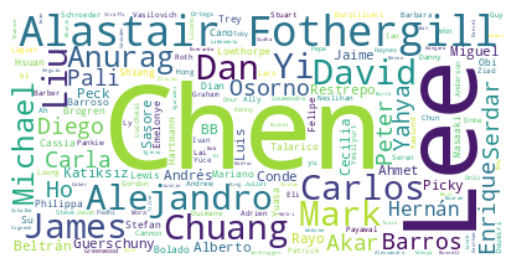

In [89]:
#Director
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

**listed_in**

cluster 0


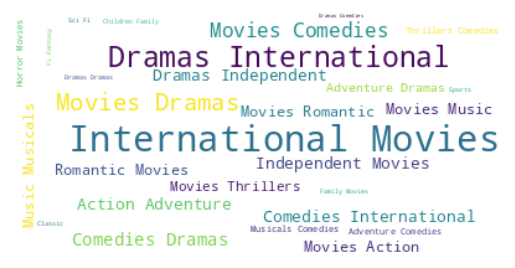

cluster 1


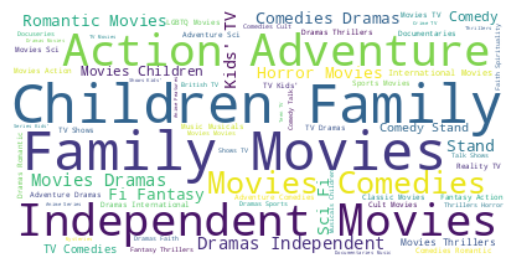

cluster 2


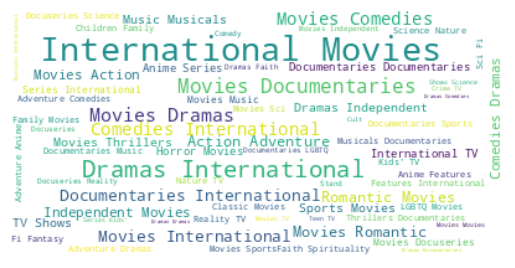

cluster 3


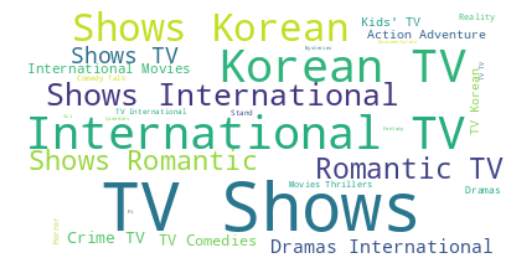

cluster 4


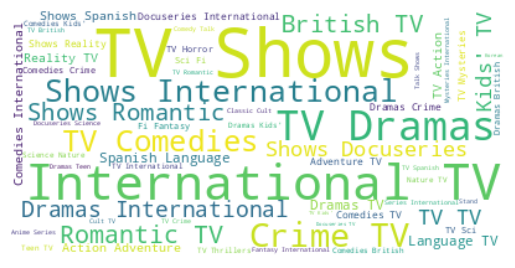

In [90]:
#listed_in
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

**country**

cluster 0


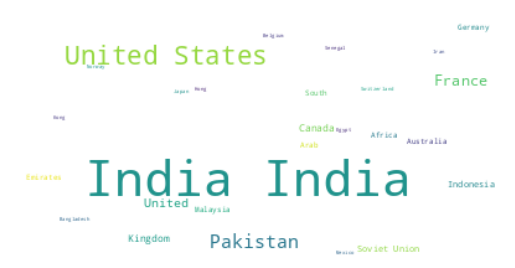

cluster 1


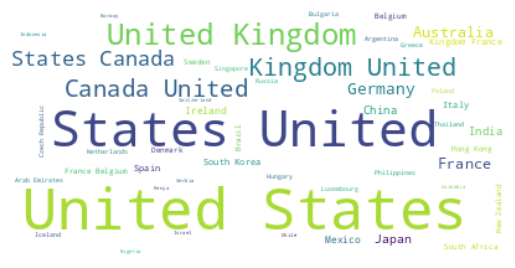

cluster 2


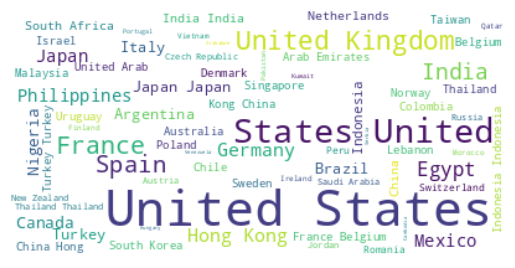

cluster 3


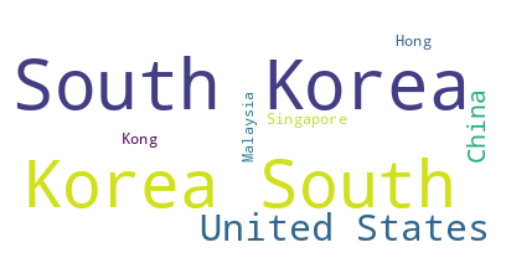

cluster 4


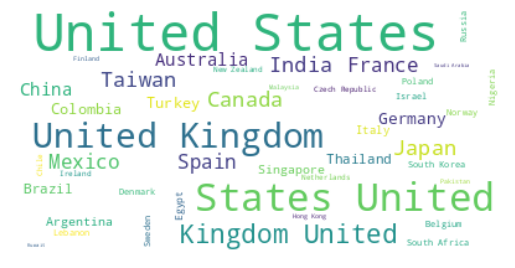

In [91]:
#country
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

#title

cluster 0


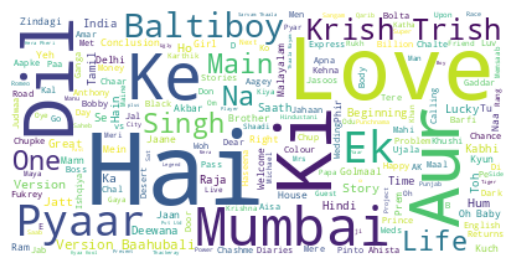

cluster 1


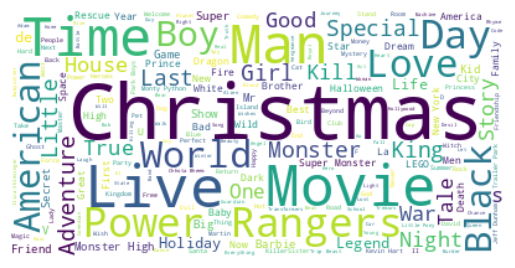

cluster 2


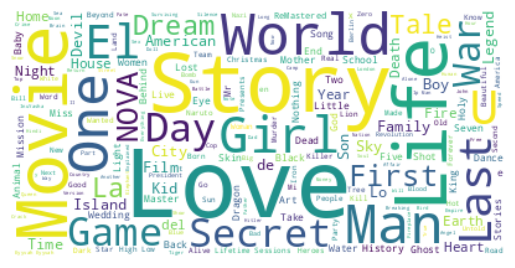

cluster 3


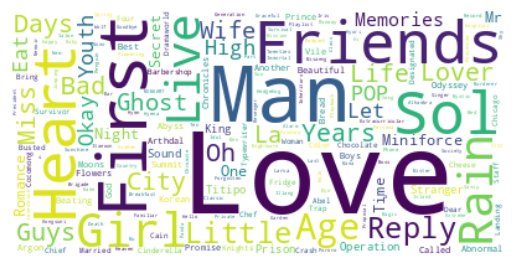

cluster 4


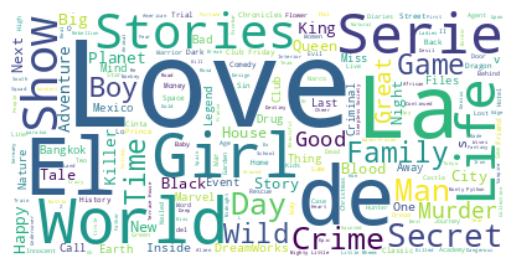

In [92]:
#title
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

#**2.Hierarchical clustering**

Agglomerative hierarchical clustering is a method that groups similar data points into clusters based on a distance metric. The clusters are merged iteratively until all data points belong to the same cluster, resulting in a dendrogram that shows the relationships between the clusters.

To determine the optimal number of clusters, we can examine the dendrogram and identify the vertical distance at which the clusters are most dissimilar. We can then draw a horizontal line at this distance and count the number of vertical lines it intersects. This count corresponds to the optimal number of clusters for our data. This approach helps to visually identify the number of clusters that best captures the structure of the data, without the need for prior knowledge or assumptions about the number of clusters.

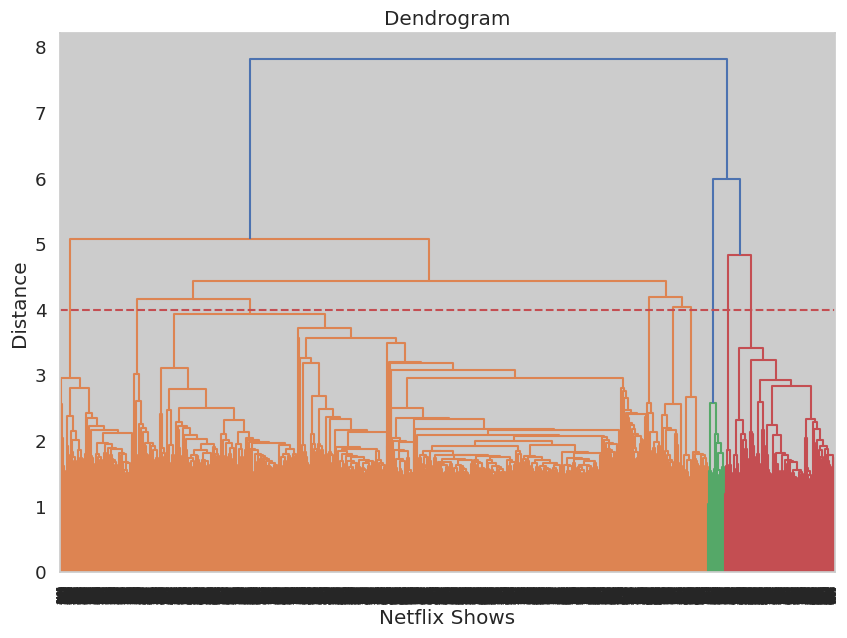

In [114]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 7))  
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')
     

**At a distance of 4 units, 7 clusters can be built using the agglomerative clustering algorithm.**

Building 7 clusters using the Agglomerative clustering algorithm:

In [115]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')  
hierarchical.fit_predict(X)
     

array([1, 1, 0, ..., 0, 1, 0])

In [116]:
# Adding a hierarchical cluster number attribute
nd['hierarchical_cluster'] = hierarchical.labels_
     

In [117]:
nd.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
852,Movie,Best of Stand-Up 2020,,"Jerry Seinfeld, Leslie Jones, Taylor Tomlinson...",United States,TV-MA,Stand-Up Comedy,"From Jerry Seinfeld to Leslie Jones, Kevin Har...",0
6899,Movie,The Squid and the Whale,Noah Baumbach,"Jeff Daniels, Laura Linney, Jesse Eisenberg, O...",United States,R,"Comedies, Dramas, Independent Movies",This insightful drama looks at the crumbling m...,0
6600,Movie,The Little Mermaid,"Blake Harris, Chris Bouchard","William Moseley, Poppy Drayton, Loreto Peralta...",United States,PG,"Children & Family Movies, Dramas","In this take on the classic tale, a captive ci...",0
851,Movie,Best Neighbors,Tamer Bassiouni,"Sameh Hussain, Menna Arafa, Merna al-Mohandes",United States,TV-14,"Comedies, International Movies",A just-married couple moves into their new hom...,0
6962,TV Show,The Underwear,,"Thanabordee Jaiyen, Emika Grant Emma, Tantimed...",United States,TV-MA,"International TV Shows, TV Dramas, Teen TV Shows",Virtual and real worlds collide as a group of ...,1


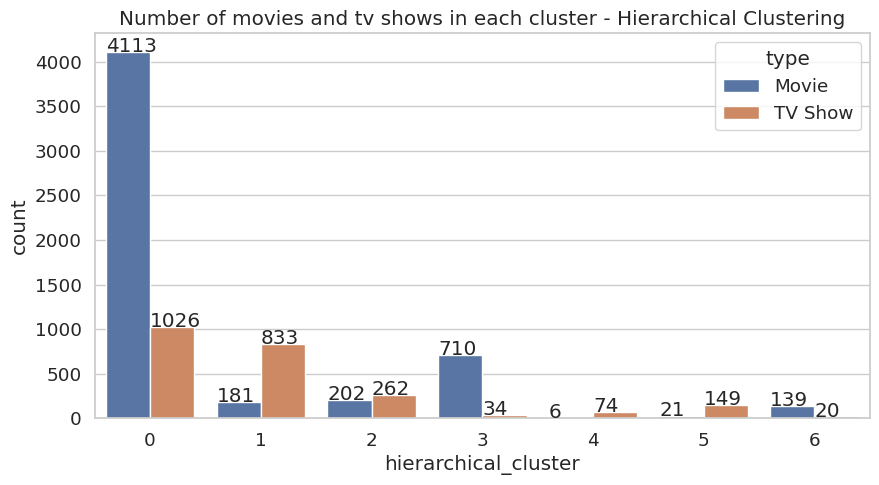

In [118]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=nd, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

Successfully built 7 clusters using the Agglomerative (hierarchical) clustering algorithm.

**Building wordclouds for different clusters in hierarchical Clustering**

In [119]:
def hierarchical_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  nd_wordcloud = nd[['hierarchical_cluster',column_name]].dropna()
  nd_wordcloud = nd_wordcloud[nd_wordcloud['hierarchical_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in nd_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "title" column for different cluster**

cluster 0


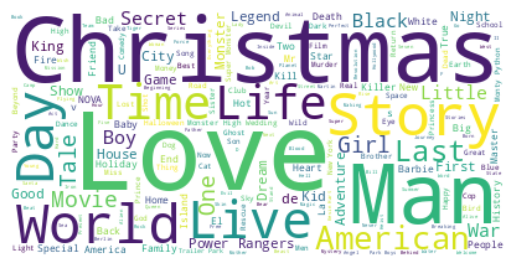

cluster 1


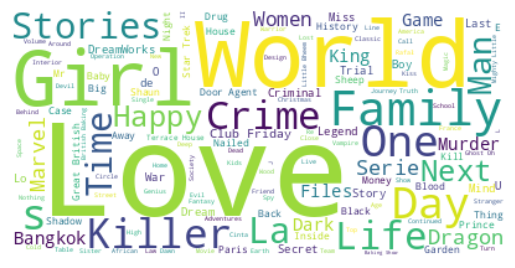

cluster 2


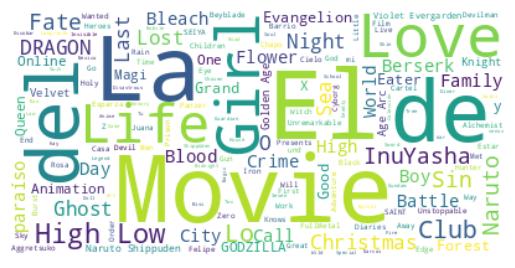

cluster 3


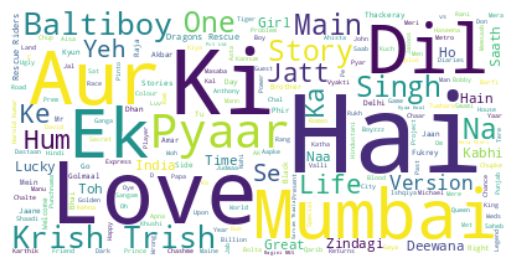

cluster 4


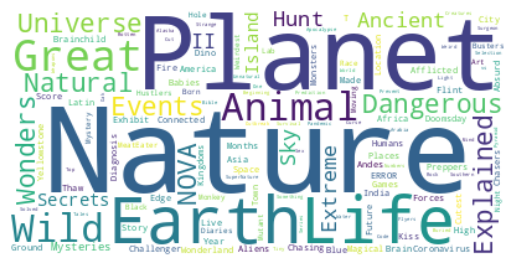

cluster 5


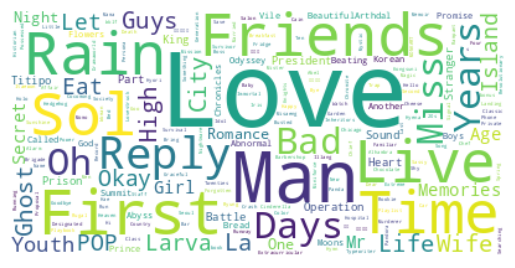

cluster 6


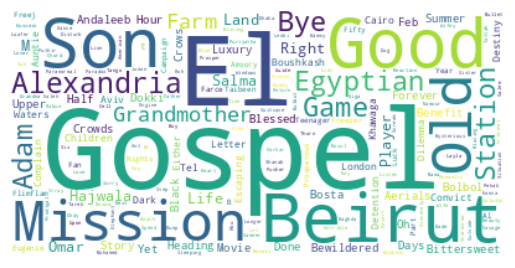

In [120]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

**Word Cloud on "description" column for different cluster**

**description**

cluster 0


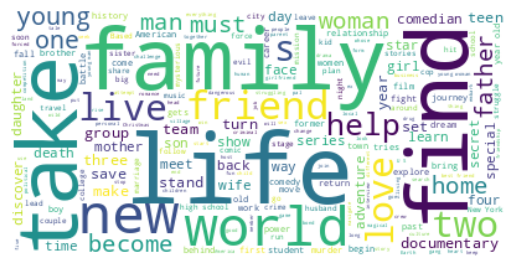

cluster 1


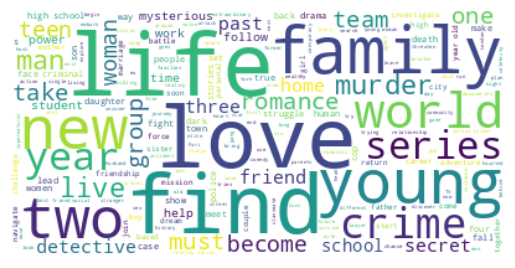

cluster 2


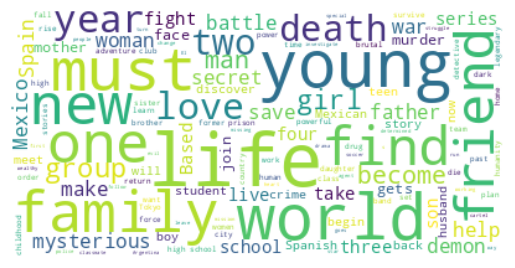

cluster 3


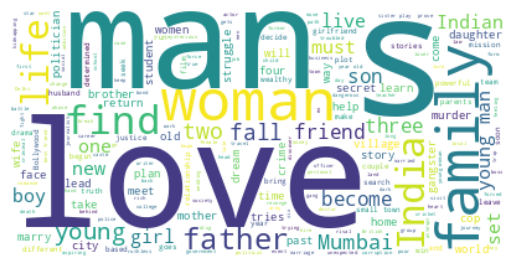

cluster 4


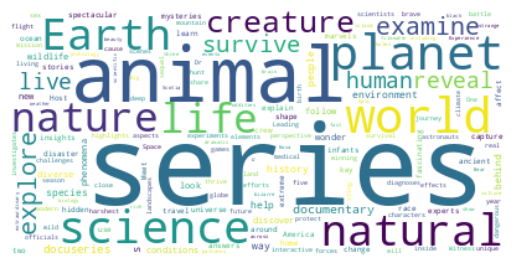

cluster 5


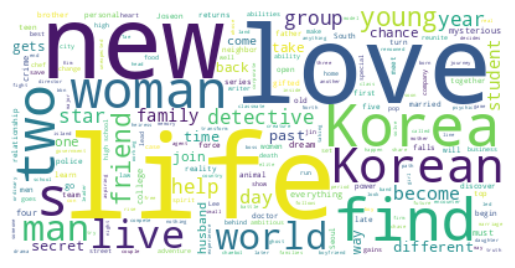

cluster 6


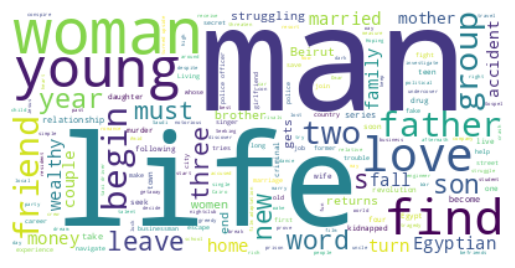

In [121]:
#description
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

**Word Cloud on "cast" column for different cluster**

**cast**

cluster 0


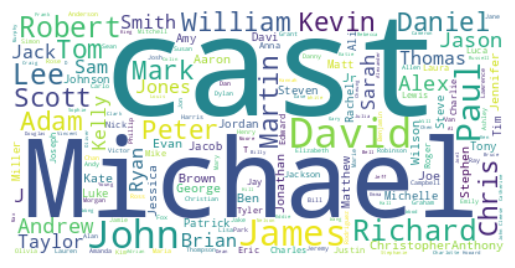

cluster 1


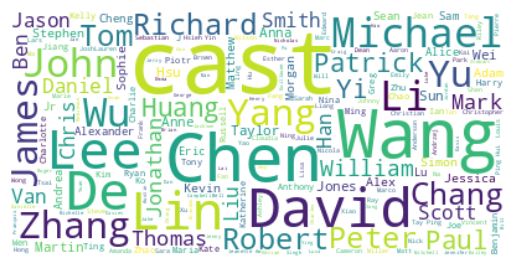

cluster 2


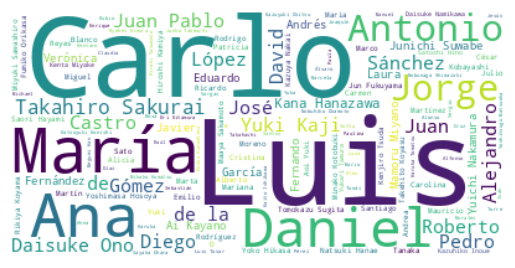

cluster 3


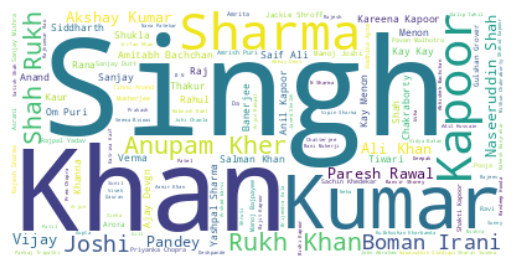

cluster 4


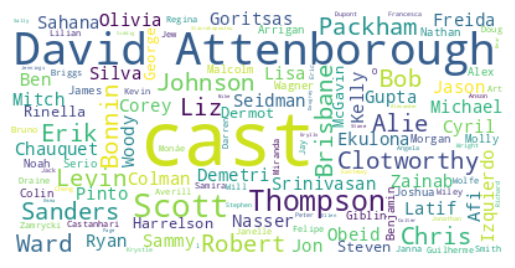

cluster 5


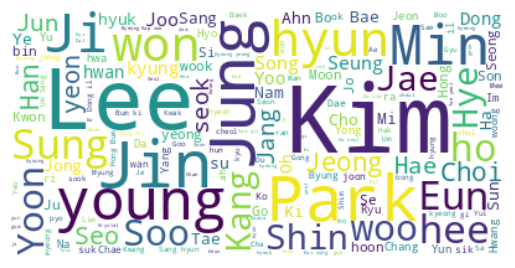

cluster 6


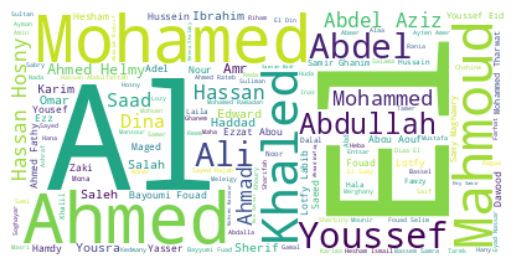

In [122]:
#cast
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

**Word Cloud on "country" column for different cluster**

cluster 0


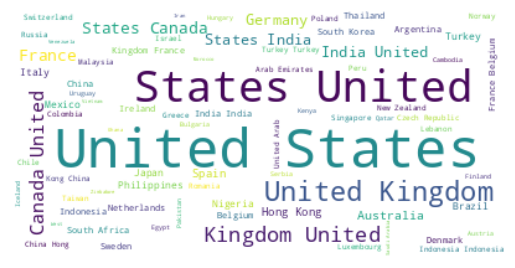

cluster 1


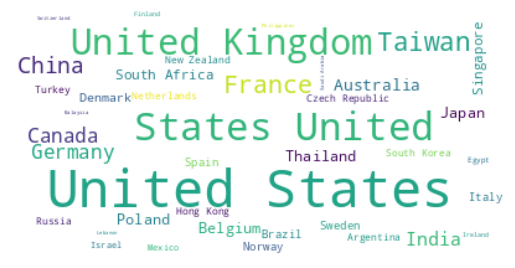

cluster 2


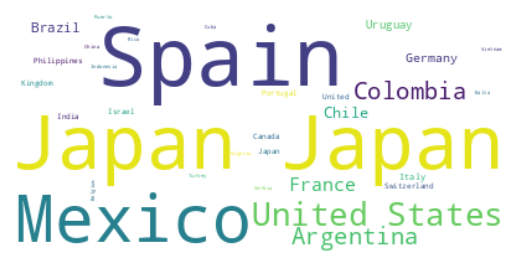

cluster 3


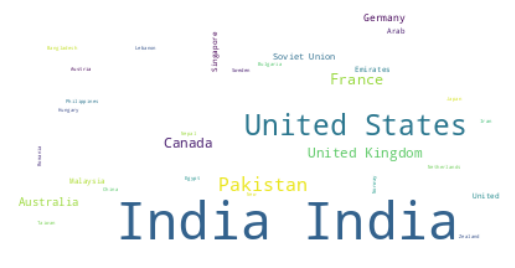

cluster 4


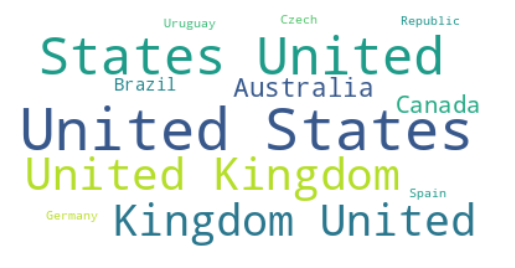

cluster 5


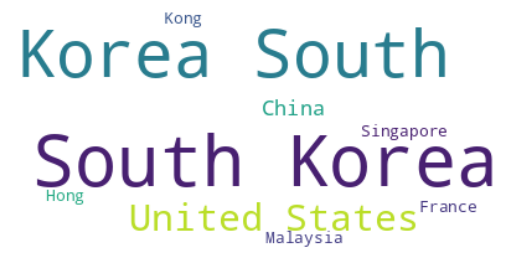

cluster 6


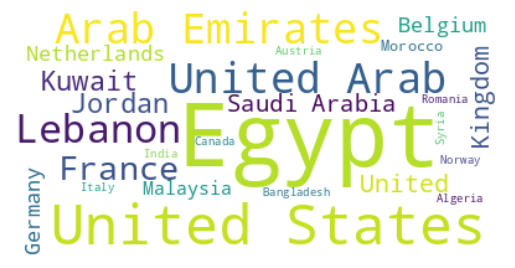

In [123]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

**Word Cloud on "listed_in (genre)" column for different cluster**

cluster 0


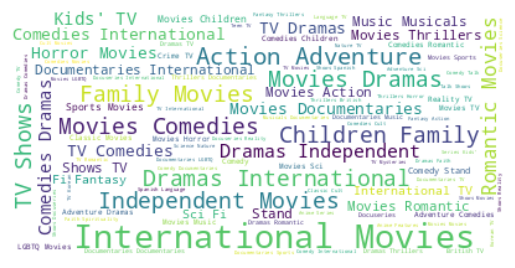

cluster 1


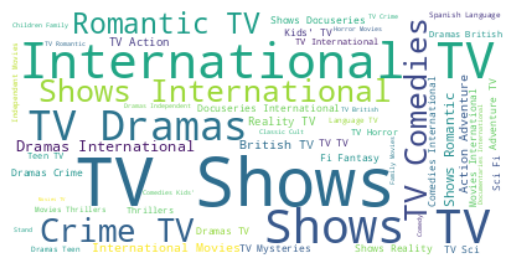

cluster 2


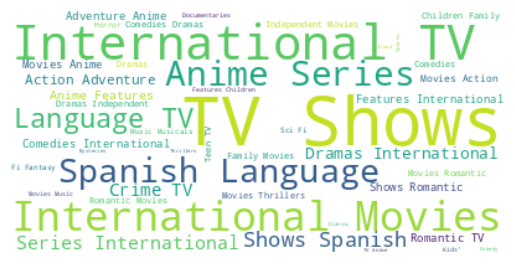

cluster 3


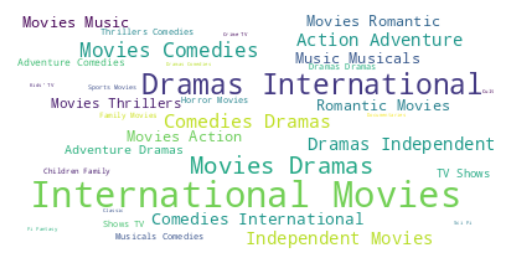

cluster 4


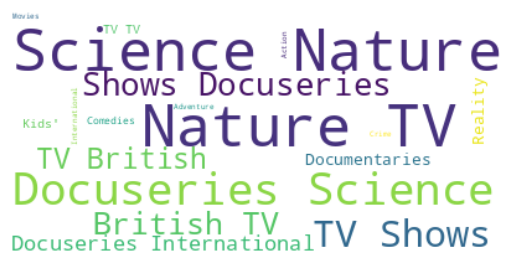

cluster 5


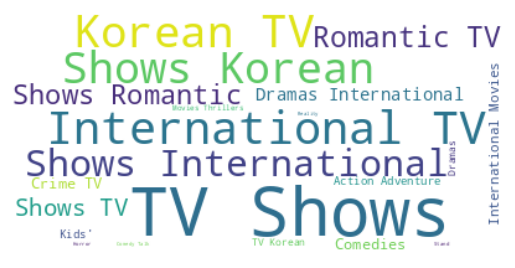

cluster 6


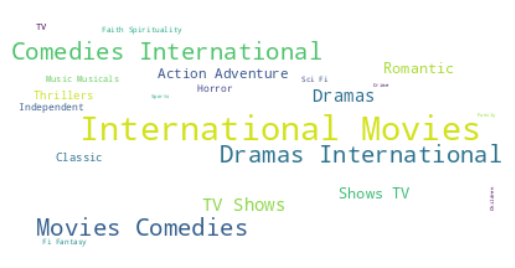

In [124]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

**Content Based Recommendation System**
Content-based recommendation systems make recommendations to users based on the similarity of items. These systems recommend items by analyzing the features or descriptions of the items and identifying the similarity between them.

To recommend items to a user, a content-based system looks at the items that the user has liked in the past, as well as the items that other users with similar preferences have liked. The system then recommends items to the user that are similar to the items they have already liked.

For example, a content-based recommender system for a streaming platform like Netflix might recommend similar shows or movies to a user based on their viewing history. To measure the similarity between shows or movies, the system can use a method like cosine similarity. This method calculates the similarity score by taking the dot product of two vectors and dividing it by the magnitude value. The closer the angle between the vectors, the higher the cosine similarity score.


In [125]:
# veryfying index
nd[['show_id', 'title', 'tags']]

,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7782,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7783,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7784,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7785,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


1.The dataset being analyzed has a total of 7770 rows. However, some rows containing null values have been removed, which means that the last index displayed in the dataset is 7786.

2.For developing a content-based recommendation system, we need to calculate the similarity score based on a specific index_id by considering the corresponding "tags" column.

3.If we fail to reset the index, the cosine similarity may get calculated for a different index, which will lead to inaccurate recommendations. Therefore, resetting the index is imperative to ensure that the recommendations are based on the accurate index.

4.Resetting the index denotes allocating a new sequential index to each row of the dataset, starting from 0. This ensures that each row has a unique and identifiable index, simplifying computations and delivering precise outcomes.

5.Thus, resetting the index is a vital process in constructing a content-based recommendation system, guaranteeing that the recommendations are based on the correct index, resulting in more precise and relevant recommendations.

In [126]:
# defining new dataframe for building recommandation system
recommender_nd = nd.copy()

# reseting index
recommender_nd.reset_index(inplace=True)

# checking whether or not reset index properly 
recommender_nd[['show_id', 'title', 'tags']]

,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7765,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7766,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7767,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7768,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


As you can see above dataframe We successfully reset the index. Now dataset is ready to build content based recommandation system

In [127]:
# dropping show-id and index column
recommender_nd.drop(columns=['index', 'show_id'], inplace=True)

In [128]:
#Setting index
print(f"before reset index id for movie 'Zero' : {nd[nd['title'] == 'Zero'].index[0]}")  # index[0] --> to locate index position
print(f"after reset index id for movie 'Zero': {recommender_nd[recommender_nd['title'] == 'Zero'].index[0]}")

before reset index id for movie 'Zero' : 7764
after reset index id for movie 'Zero': 7747


In [129]:
# calling out transformed array independent features created from tags(cluster) column after performing PCA for dimenssionality reduction.
X

array([[ 1.62770754e-01, -8.85380780e-03, -2.34244239e-02, ...,
         5.46237532e-03,  1.05890165e-04,  5.81973023e-03],
       [-4.51876579e-02, -9.27064344e-03,  1.31688188e-02, ...,
        -1.78595497e-03,  6.81948488e-03,  1.12747734e-03],
       [-4.39819888e-02, -4.74207488e-02, -3.34881492e-02, ...,
        -2.90471751e-04,  4.38134436e-03, -4.50691292e-03],
       ...,
       [-6.50688501e-02,  3.12716726e-02,  8.85613566e-02, ...,
         1.97491349e-02,  9.87748305e-04,  4.93552960e-03],
       [ 7.57150814e-02,  4.35981475e-02,  2.25945606e-02, ...,
        -8.96760576e-03,  1.23094066e-02, -1.03567519e-02],
       [-5.65400850e-02,  1.72672124e-01,  1.38299413e-01, ...,
        -5.78803565e-03, -7.40427943e-03, -2.68350735e-03]])

In [130]:
# calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.08776614,  0.02326954, ..., -0.02524384,
         0.01094016, -0.02184533],
       [ 0.08776614,  1.        , -0.00430122, ...,  0.06972763,
        -0.00983306, -0.00915573],
       [ 0.02326954, -0.00430122,  1.        , ..., -0.00201134,
        -0.01135075, -0.01246755],
       ...,
       [-0.02524384,  0.06972763, -0.00201134, ...,  1.        ,
        -0.01505418,  0.05308061],
       [ 0.01094016, -0.00983306, -0.01135075, ..., -0.01505418,
         1.        ,  0.04592587],
       [-0.02184533, -0.00915573, -0.01246755, ...,  0.05308061,
         0.04592587,  1.        ]])

**Function for list down top 10 recommended movie on the basis of cosine similarity score.**

In [131]:
def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # find out index position
    index = recommender_nd[recommender_nd['title'] == movie].index[0]

    # sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x:x[1])
    
    # listing top ten recommenaded movie
    for i in distances[1:11]:
        print(nd.iloc[i[0]].title)

In [132]:
recommend('Naruto')

If you liked 'Naruto', you may also enjoy: 

Naruto Shippûden the Movie: Bonds
Naruto Shippuden: The Movie
Naruto Shippuden : Blood Prison
Naruto the Movie 2: Legend of the Stone of Gelel
Naruto Shippûden the Movie: The Will of Fire
Naruto the Movie 3: Guardians of the Crescent Moon Kingdom
Naruto Shippuden: The Movie: The Lost Tower
DRIFTING DRAGONS
Dino Girl Gauko
Marvel Anime: Wolverine


In [133]:
recommend('Our Planet')

If you liked 'Our Planet', you may also enjoy: 

Nature's Great Events: Diaries
Nature's Great Events (2009)
Nature's Weirdest Events
Blue Planet II
Planet Earth II
The Making of Frozen Planet
Life Story
Night on Earth
The Hunt
Moving Art


In [134]:
recommend('Phir Hera Pheri')

If you liked 'Phir Hera Pheri', you may also enjoy: 

Bhool Bhulaiyaa
Thank You
Golmaal: Fun Unlimited
Bhagam Bhag
Ready
Chup Chup Ke
Khushi
Life in a ... Metro
Hattrick
Hasee Toh Phasee


### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

In conclusion, our project on clustering Netflix movies and TV shows was successful in creating a content-based recommender system that suggests 10 shows based on the user's viewing history. We identified six key attributes, namely director, cast, country, genre, rating, and description, and transformed them into a 10000-feature TFInd vectorization. Through PCA, we reduced the dimensionality to 3000 components, capturing over 80% of the variance.

With over 7787 records and 11 attributes, we began our adventure by delving into the dataset's missing values and performing exploratory data analysis (EDA). Our findings revealed that Netflix boasts more movies than TV shows, with a rapidly growing collection of shows from the United States.

We employed two clustering algorithms, K-Means and Agglomerative clustering, to group the shows. K-Means determined the optimal number of clusters to be 5, while Agglomerative clustering suggested 7 clusters. The resulting clusters were visualized using a dendrogram.

Finally, we used cosine similarity to obtain a similarity matrix and create a personalized recommender system. The system provides users with 10 top-notch show recommendations based on their viewing history.

Lastly, our project demonstrates the value of clustering algorithms and their ability to group similar shows and movies. With the growing number of Netflix titles, this system provides users with personalized recommendations, leading to a more enjoyable viewing experience.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***